# Final DataSet preperation
- calll all dataset 
- marge by Patient ID which is MRN


In [34]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import missingno as msno
import seaborn as sns
import warnings
import os
import scipy

from scipy import stats
from scipy.stats import pearsonr
from scipy.stats import ttest_ind
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
# from imblearn.over_sampling import SMOTE

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import CategoricalNB
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [ ]:
import pandas as pd

# Load datasets
df1 = pd.read_csv('C:/Users/Daveee/Downloads/Diagnosis.csv')
df2 = pd.read_csv('C:/Users/Daveee/Downloads/Vital And Physical.csv')
df3 = pd.read_csv('C:/Users/Daveee/Downloads/Services.csv')
df4 = pd.read_csv('C:/Users/Daveee/Downloads/History.csv')
df5 = pd.read_csv('C:/Users/Daveee/Downloads/Prescription.csv')

# Ensure that all datasets have 150,939 rows, adjusting as needed
target_rows = 150939

def adjust_rows(df, target_rows):
    current_rows = len(df)
    if current_rows > target_rows:
        # Truncate rows if dataframe has more than 150,939 rows
        return df.iloc[:target_rows]
    elif current_rows < target_rows:
        # Pad with NaN values if dataframe has less than 150,939 rows
        padding = pd.DataFrame([[None] * len(df.columns)], columns=df.columns)
        padded_df = pd.concat([df, pd.concat([padding] * (target_rows - current_rows), ignore_index=True)], ignore_index=True)
        return padded_df
    return df

# Adjust rows for each dataframe
df2_adjusted = adjust_rows(df2[['Record', 'Value']], target_rows)  # Replace with actual column names
df3_adjusted = adjust_rows(df3[['Service', 'Price', 'Is Paid', 'Is Available']], target_rows)
df4_adjusted = adjust_rows(df4[['Record Type', 'Value']], target_rows)
df5_adjusted = adjust_rows(df5[['Record Type', 'Prescribed Item']], target_rows)

# Concatenate df1 with the selected columns from other dataframes
df_final = pd.concat([df1, df2_adjusted, df3_adjusted, df4_adjusted, df5_adjusted], axis=1)

# Save the final dataset to a new CSV file
df_final.to_csv('C:/Users/Daveee/Desktop/image caption model with app/Text Datasets/FilteredDataset.csv', index=False)


C:\Users\Daveee\AppData\Local\Temp\ipykernel_24544\323699432.py:4: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df1 = pd.read_csv('C:/Users/Daveee/Downloads/Diagnosis.csv')
C:\Users\Daveee\AppData\Local\Temp\ipykernel_24544\323699432.py:5: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df2 = pd.read_csv('C:/Users/Daveee/Downloads/Vital And Physical.csv')


In [4]:
df_final

,MRN,Age,Sex,Occupation,Region,Zone,City,SubCity,Woreda,Kebel,...,Record,Value,Service,Price,Is Paid,Is Available,Record Type,Value,Record Type,Prescribed Item
0,272161.0,50.0,Male,NaN,"Southern Nations, Nationalities and Peoples",Gurage,Welkite,NaN,Welkite,NaN,...,Weight (kg),83,CT Abdomen,535.0,1,1,HISTORY,Known cardiac pt on follow up on atenolol 25mg...,Prescription,"{""Name"":""paracetamol"",""Strength"":""10mg"",""Presc..."
1,212951.0,62.0,Male,NaN,Addis Ababa,Addis Ababa,Addis Ababa,Yeka,1,NaN,...,BP,112/62,CT Abdomen Triphasic Scan (Liver / Renal),535.0,1,1,HISTORY,has no compliant,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""METRENDAZ..."
2,271933.0,45.0,Female,NaN,Oromia,Oromia-Finfinne,BURAYU,NaN,BURAYU,NaN,...,Weight (kg),92,CT Angiography with Contrast,800.0,1,1,HISTORY,c/c: BACK PAIN/01 month 45yrs old female pati...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""CEFTRIAXO..."
3,272501.0,26.0,Female,NaN,Addis Ababa,Addis Ababa,Addis Ababa,Lideta,3,NaN,...,BP,120/91,CT Brain,535.0,1,1,HISTORY,vitals: BP: 100/60 PR: 80 RR: 20 T: ATT,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""HEPARINE ..."
4,167838.0,3.0,Male,NaN,Oromia,Oromia-Finfinne,Metw,Metwe,Metw,NaN,...,Weight (kg),40,CT Elbow Joint,535.0,1,1,HISTORY,known cardiac pt on follow up currently has ...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""SYRINGE 1..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150934,181366.0,0.0,Male,NaN,Addis Ababa,Addis Ababa,Addis Ababa,Lideta,3,NaN,...,General Appearance,CSL,CRP,80.0,1,1,HISTORY,P; cerebelar ataxia 2ry to ?primary progressiv...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""DEXAMETAS..."
150935,192533.0,55.0,Male,NaN,Amhara,East Gojjam,Gozamer,Gozamer,Gozamre,NaN,...,BP,120/85,ELE,450.0,0,0,MANAGEMENT,RTC after 01 and 2 weeks,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""10cc syri..."
150936,195936.0,27.0,Female,NaN,Addis Ababa,Addis Ababa,Addis Ababa,Addis Ketema,6,33,...,Weight (kg),99,RFT,100.0,0,0,HISTORY,"p-post GDM, 4WK POST PARTUM INSULIN HOLDED FBS...",Prescription,"{""PrescriptionType"":""Supply"",""Name"":""glove"",""S..."
150937,197688.0,37.0,Male,NaN,Oromia,Jimma,Jimma,Jimma,Jimma,NaN,...,CNS,alert,New Patient Registration,100.0,1,0,HISTORY,"Warfarin 7.5mg po 6day/wk, 5mg 1day/wk for 01m...",Prescription,"{""PrescriptionType"":""Supply"",""Name"":""NS"",""Stre..."


## filter out unit 
- Oncology', 
- 'Oncology Ward (D-8 Ward)', 
- 'Hematology', 
- 'Gynecology OPD'

In [5]:
df9 = pd.read_csv('C:/Users/Daveee/Desktop/image caption model with app/Text Datasets/FilteredDataset.csv')
# Define the list of units to filter
units_to_extract = ['Oncology', 'Oncology Ward (D-8 Ward)', 'Hematology', 'Gynecology OPD']

# Filter the dataframe where Unit is one of the specified values
filtered_df = df9[df9['Unit'].isin(units_to_extract)]

# Save the filtered data to a new CSV file (optional)
filtered_df.to_csv('C:/Users/Daveee/Desktop/image caption model with app/Text Datasets/FilteredDatasetDiagnosis.csv', index=False)

# Display the filtered dataframe
filtered_df

C:\Users\Daveee\AppData\Local\Temp\ipykernel_4416\4023202929.py:1: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df9 = pd.read_csv('C:/Users/Daveee/Desktop/image caption model with app/Text Datasets/FilteredDataset.csv')


,MRN,Age,Sex,Occupation,Region,Zone,City,SubCity,Woreda,Kebel,...,Record,Value,Service,Price,Is Paid,Is Available,Record Type,Value.1,Record Type.1,Prescribed Item
0,272161.0,50.0,Male,NaN,"Southern Nations, Nationalities and Peoples",Gurage,Welkite,NaN,Welkite,NaN,...,Weight (kg),83,CT Abdomen,535.0,1,1,HISTORY,Known cardiac pt on follow up on atenolol 25mg...,Prescription,"{""Name"":""paracetamol"",""Strength"":""10mg"",""Presc..."
2,271933.0,45.0,Female,NaN,Oromia,Oromia-Finfinne,BURAYU,NaN,BURAYU,NaN,...,Weight (kg),92,CT Angiography with Contrast,800.0,1,1,HISTORY,c/c: BACK PAIN/01 month 45yrs old female pati...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""CEFTRIAXO..."
5,272272.0,51.0,Female,NaN,Addis Ababa,Addis Ababa,Addis Ababa,Yeka,1,NaN,...,BP,97/62,CT Chest,535.0,1,1,HISTORY,P/E H.E.E.N.T: pink conjuctivae and NICS LGS:...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""PLASILE 1..."
10,272380.0,72.0,Female,NaN,Benshangul-Gumaz,Asosa,Asosa,NaN,Asosa,NaN,...,Weight (kg),78,CT Angiography with Contrast,800.0,0,0,HISTORY,he is a 19 year old patient who had followup a...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""GLOVE "",""..."
13,267125.0,60.0,Male,NaN,"Southern Nations, Nationalities and Peoples",Gurage,GURAGE,NaN,ENDGJE,NaN,...,BP,95/62,HBsAg,50.0,0,0,HISTORY,Known HTN with HHD and polycythemia pt and B.A...,Prescription,"{""PrescriptionType"":""Medication"",""Name"":""Olanz..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150925,193905.0,40.0,Female,NaN,Oromia,East Shewa,Adama,Adama,Adama,NaN,...,CVS,unremarkable,HCV,50.0,1,1,MANAGEMENT,CBC ABO-RH ESR CXR LINK TO GENERAL SURGERY (CO...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""NORMAL SA..."
150927,192271.0,45.0,Female,NaN,Addis Ababa,Addis Ababa,Addis Ababa,Gullele,6,NaN,...,RR,18,CHEST X RAY LATERAL,80.0,1,1,HISTORY,INR 2.44,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""VACOMYCIN..."
150928,1323.0,39.0,Female,NaN,Oromia,Oromia-Finfinne,Oromia-Finfinne,NaN,sebeta,NaN,...,SP°2,96,CHEST X RAY PA,80.0,1,1,MANAGEMENT,Warfarin 5mg po/day for 01month,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""IV CAMULA..."
150929,10222.0,21.0,Male,NaN,NaN,NaN,NaN,KIRKOS,NaN,NaN,...,Integumentary,"there are excoriation marks over the leg, the ...",New Patient Registration,100.0,1,0,HISTORY,P: MDD + Conversion d/o Rx: Flouxetine 20mg PO...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""amoxacill..."


In [6]:
filtered_df.columns

Index(['MRN', 'Age', 'Sex', 'Occupation', 'Region', 'Zone', 'City', 'SubCity',
       'Woreda', 'Kebel', 'Diagnosis', 'Group', 'Type', 'Status', 'Date',
       'Unit', 'Record', 'Value', 'Service', 'Price', 'Is Paid',
       'Is Available', 'Record Type', 'Value.1', 'Record Type.1',
       'Prescribed Item'],
      dtype='object')

# filter out redance basde on the region 
- Urban='Addis Ababa', 'Dire Dawa', 'Mekelle', 'Bahir Dar', 'Hawassa', 
                 'Adama', 'Semera', 'Jijiga', 'Asosa', 'Gambela'
-  if not above rular

In [7]:
import numpy as np

# List of urban regions
urban_regions = ['Addis Ababa', 'Dire Dawa', 'Mekelle', 'Bahir Dar', 'Hawassa', 
                 'Adama', 'Semera', 'Jijiga', 'Asosa', 'Gambela']

# Create the 'Residence' column: 'urban' if in the list of urban regions, else 'rural'
filtered_df['Residence'] = np.where(filtered_df['Region'].isin(urban_regions), 'urban', 'rural')

# Display the dataframe with the new 'Residence' column
filtered_df.head()


C:\Users\Daveee\AppData\Local\Temp\ipykernel_4416\3764823483.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['Residence'] = np.where(filtered_df['Region'].isin(urban_regions), 'urban', 'rural')


,MRN,Age,Sex,Occupation,Region,Zone,City,SubCity,Woreda,Kebel,...,Value,Service,Price,Is Paid,Is Available,Record Type,Value.1,Record Type.1,Prescribed Item,Residence
0,272161.0,50.0,Male,NaN,"Southern Nations, Nationalities and Peoples",Gurage,Welkite,NaN,Welkite,NaN,...,83,CT Abdomen,535.0,1,1,HISTORY,Known cardiac pt on follow up on atenolol 25mg...,Prescription,"{""Name"":""paracetamol"",""Strength"":""10mg"",""Presc...",rural
2,271933.0,45.0,Female,NaN,Oromia,Oromia-Finfinne,BURAYU,NaN,BURAYU,NaN,...,92,CT Angiography with Contrast,800.0,1,1,HISTORY,c/c: BACK PAIN/01 month 45yrs old female pati...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""CEFTRIAXO...",rural
5,272272.0,51.0,Female,NaN,Addis Ababa,Addis Ababa,Addis Ababa,Yeka,1,NaN,...,97/62,CT Chest,535.0,1,1,HISTORY,P/E H.E.E.N.T: pink conjuctivae and NICS LGS:...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""PLASILE 1...",urban
10,272380.0,72.0,Female,NaN,Benshangul-Gumaz,Asosa,Asosa,NaN,Asosa,NaN,...,78,CT Angiography with Contrast,800.0,0,0,HISTORY,he is a 19 year old patient who had followup a...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""GLOVE "",""...",rural
13,267125.0,60.0,Male,NaN,"Southern Nations, Nationalities and Peoples",Gurage,GURAGE,NaN,ENDGJE,NaN,...,95/62,HBsAg,50.0,0,0,HISTORY,Known HTN with HHD and polycythemia pt and B.A...,Prescription,"{""PrescriptionType"":""Medication"",""Name"":""Olanz...",rural


# form the Diagnosis filter out type of tumor 

In [8]:
# Function to filter values
def filter_disease_classification(value):
    if pd.isna(value):
        return None
    value = value.lower()
    if 'benign' in value:
        return 'Benign'
    elif 'malignant' in value:
        return 'Malignant'
    else:
        return None

# Apply the filter function to create the 'Severity_level_classification' column
filtered_df['Tumor_Type'] = filtered_df['Diagnosis'].apply(filter_disease_classification)

# Fill NA values in 'diagnosis' with the mode of the column
mode_value = filtered_df['Tumor_Type'].mode()[0]
filtered_df['Tumor_Type'].fillna(mode_value, inplace=True)

C:\Users\Daveee\AppData\Local\Temp\ipykernel_4416\3135893285.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['Tumor_Type'] = filtered_df['Diagnosis'].apply(filter_disease_classification)
C:\Users\Daveee\AppData\Local\Temp\ipykernel_4416\3135893285.py:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['Tumor_Type'].fillna(mode_value, inplace=True)


In [9]:
filtered_df.columns

Index(['MRN', 'Age', 'Sex', 'Occupation', 'Region', 'Zone', 'City', 'SubCity',
       'Woreda', 'Kebel', 'Diagnosis', 'Group', 'Type', 'Status', 'Date',
       'Unit', 'Record', 'Value', 'Service', 'Price', 'Is Paid',
       'Is Available', 'Record Type', 'Value.1', 'Record Type.1',
       'Prescribed Item', 'Residence', 'Tumor_Type'],
      dtype='object')

# from tumor type have classified as four cancer stage 
- Benign, stage1,& stage2 based on the Diagnosis and Prescribed Item
- Malignant, stage3 & stage4 based on the Diagnosis and Prescribed Item

In [10]:
# Function to determine the stage based on the classification of disease
def determine_stage(classification):
    if 'Benign neoplasm' in classification:
        return 'stage1'
    elif 'Benign' in classification:
        return 'stage2'
    elif 'Malignant neoplasm' in classification:
        return 'stage3'
    else:
        return 'stage4'

# Apply the function to the 'Classification of Disease' column to create the new 'Stage' column
filtered_df['Stage'] = filtered_df['Diagnosis'].apply(determine_stage)

C:\Users\Daveee\AppData\Local\Temp\ipykernel_4416\180421471.py:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  filtered_df['Stage'] = filtered_df['Diagnosis'].apply(determine_stage)


In [11]:
filtered_df.columns

Index(['MRN', 'Age', 'Sex', 'Occupation', 'Region', 'Zone', 'City', 'SubCity',
       'Woreda', 'Kebel', 'Diagnosis', 'Group', 'Type', 'Status', 'Date',
       'Unit', 'Record', 'Value', 'Service', 'Price', 'Is Paid',
       'Is Available', 'Record Type', 'Value.1', 'Record Type.1',
       'Prescribed Item', 'Residence', 'Tumor_Type', 'Stage'],
      dtype='object')

In [12]:
filtered_df

,MRN,Age,Sex,Occupation,Region,Zone,City,SubCity,Woreda,Kebel,...,Price,Is Paid,Is Available,Record Type,Value.1,Record Type.1,Prescribed Item,Residence,Tumor_Type,Stage
0,272161.0,50.0,Male,NaN,"Southern Nations, Nationalities and Peoples",Gurage,Welkite,NaN,Welkite,NaN,...,535.0,1,1,HISTORY,Known cardiac pt on follow up on atenolol 25mg...,Prescription,"{""Name"":""paracetamol"",""Strength"":""10mg"",""Presc...",rural,Malignant,stage3
2,271933.0,45.0,Female,NaN,Oromia,Oromia-Finfinne,BURAYU,NaN,BURAYU,NaN,...,800.0,1,1,HISTORY,c/c: BACK PAIN/01 month 45yrs old female pati...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""CEFTRIAXO...",rural,Malignant,stage3
5,272272.0,51.0,Female,NaN,Addis Ababa,Addis Ababa,Addis Ababa,Yeka,1,NaN,...,535.0,1,1,HISTORY,P/E H.E.E.N.T: pink conjuctivae and NICS LGS:...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""PLASILE 1...",urban,Malignant,stage3
10,272380.0,72.0,Female,NaN,Benshangul-Gumaz,Asosa,Asosa,NaN,Asosa,NaN,...,800.0,0,0,HISTORY,he is a 19 year old patient who had followup a...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""GLOVE "",""...",rural,Malignant,stage3
13,267125.0,60.0,Male,NaN,"Southern Nations, Nationalities and Peoples",Gurage,GURAGE,NaN,ENDGJE,NaN,...,50.0,0,0,HISTORY,Known HTN with HHD and polycythemia pt and B.A...,Prescription,"{""PrescriptionType"":""Medication"",""Name"":""Olanz...",rural,Malignant,stage3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
150925,193905.0,40.0,Female,NaN,Oromia,East Shewa,Adama,Adama,Adama,NaN,...,50.0,1,1,MANAGEMENT,CBC ABO-RH ESR CXR LINK TO GENERAL SURGERY (CO...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""NORMAL SA...",rural,Malignant,stage4
150927,192271.0,45.0,Female,NaN,Addis Ababa,Addis Ababa,Addis Ababa,Gullele,6,NaN,...,80.0,1,1,HISTORY,INR 2.44,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""VACOMYCIN...",urban,Malignant,stage4
150928,1323.0,39.0,Female,NaN,Oromia,Oromia-Finfinne,Oromia-Finfinne,NaN,sebeta,NaN,...,80.0,1,1,MANAGEMENT,Warfarin 5mg po/day for 01month,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""IV CAMULA...",rural,Malignant,stage4
150929,10222.0,21.0,Male,NaN,NaN,NaN,NaN,KIRKOS,NaN,NaN,...,100.0,1,0,HISTORY,P: MDD + Conversion d/o Rx: Flouxetine 20mg PO...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""amoxacill...",rural,Malignant,stage4


In [14]:
filtered_df.to_csv('C:/Users/Daveee/Desktop/image caption model with app/Text Datasets/FilteredDatasetDiagnosis.csv', index=False)

## Stage and Tumor type reformulated 

In [26]:
df.columns

Index(['Unnamed: 0', 'MRN', 'Age', 'Sex', 'Occupation', 'Region', 'Zone',
       'City', 'SubCity', 'Woreda', 'Kebel', 'Diagnosis', 'Group diagonsis',
       'Type diagnosis', 'Status', 'Date', 'Unit', 'Pacient Weight', 'BMI',
       'Laboratory Service ', 'Price', 'Is Paid', 'Is Available',
       'HistoryType', 'History value ', 'Prescrption Type', 'Prescribed Item',
       'Residence', 'Tumor_Type', 'Stage'],
      dtype='object')

In [27]:
# Function to filter values
def filter_disease_classification(value):
    if pd.isna(value):
        return None
    value = value.lower()
    if 'malignant' in value:
        return 'Malignant'
    else:
        return 'Benign'

# Apply the filter function to create the 'Severity_level_classification' column
df['Tumor_Type'] = df['Diagnosis'].apply(filter_disease_classification)

# # Fill NA values in 'diagnosis' with the mode of the column
# mode_value = filtered_df['Tumor_Type'].mode()[0]
# filtered_df['Tumor_Type'].fillna(mode_value, inplace=True)

In [28]:
df['Stage'].value_counts()

Stage
stage2    10639
stage3     8666
stage4      218
stage1      201
Name: count, dtype: int64

In [29]:
def determine_stage(classification):
    if isinstance(classification, str):  # Ensure it's a string
        if 'Malignant neoplasm' in classification:
            return 'stage3'
        elif 'Malignant' in classification:
            return 'stage4'
        elif 'Benign neoplasm' in classification:
            return 'stage1'
    return 'stage2'  # Default for non-matching or non-string values

# Apply the function to the 'Diagnosis' column to create the new 'Stage' column
df['Stage'] = df['Diagnosis'].apply(determine_stage)

In [30]:
df.to_csv('C:/Users/Daveee/Desktop/Tumor & Stage coding/Cancer_Stage/Text Datasets/FilteredDatasetDiagnosis.csv')
df

,Unnamed: 0,MRN,Age,Sex,Occupation,Region,Zone,City,SubCity,Woreda,...,Price,Is Paid,Is Available,HistoryType,History value,Prescrption Type,Prescribed Item,Residence,Tumor_Type,Stage
0,0,272161.0,50.0,Male,NaN,"Southern Nations, Nationalities and Peoples",Gurage,Welkite,NaN,Welkite,...,535.0,1.0,1.0,HISTORY,Known cardiac pt on follow up on atenolol 25mg...,Prescription,"{""Name"":""paracetamol"",""Strength"":""10mg"",""Presc...",rural,Malignant,stage3
1,1,271933.0,45.0,Female,NaN,Oromia,Oromia-Finfinne,BURAYU,NaN,BURAYU,...,800.0,1.0,1.0,HISTORY,c/c: BACK PAIN/01 month 45yrs old female pati...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""CEFTRIAXO...",rural,Malignant,stage3
2,2,272272.0,51.0,Female,NaN,Addis Ababa,Addis Ababa,Addis Ababa,Yeka,1,...,535.0,1.0,1.0,HISTORY,P/E H.E.E.N.T: pink conjuctivae and NICS LGS:...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""PLASILE 1...",urban,Malignant,stage3
3,3,272380.0,72.0,Female,NaN,Benshangul-Gumaz,Asosa,Asosa,NaN,Asosa,...,800.0,0.0,0.0,HISTORY,he is a 19 year old patient who had followup a...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""GLOVE "",""...",rural,Malignant,stage3
4,4,267125.0,60.0,Male,NaN,"Southern Nations, Nationalities and Peoples",Gurage,GURAGE,NaN,ENDGJE,...,50.0,0.0,0.0,HISTORY,Known HTN with HHD and polycythemia pt and B.A...,Prescription,"{""PrescriptionType"":""Medication"",""Name"":""Olanz...",rural,Malignant,stage3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19719,19719,10222.0,21.0,Male,NaN,NaN,NaN,NaN,KIRKOS,NaN,...,100.0,1.0,0.0,HISTORY,P: MDD + Conversion d/o Rx: Flouxetine 20mg PO...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""amoxacill...",rural,Benign,stage2
19720,19720,160158.0,29.0,Female,NaN,Addis Ababa,Addis Ababa,Addis Ababa,Kolfe,3,...,100.0,1.0,0.0,HISTORY,GDM + LATE 2ND TMP ON DIATERY MODIFICATION S...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""ns"",""Stre...",urban,Benign,stage2
19721,19721,NaN,NaN,NaN,farmer,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,stage2
19722,19722,NaN,NaN,NaN,Self_employes,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,None,stage2


## Edication columns created and Threated 

In [32]:
df= pd.read_csv('C:/Users/Daveee/Desktop/Tumor & Stage coding/Cancer_Stage/Text Datasets/FilteredDatasetDiagnosis.csv')
df

,Unnamed: 0,MRN,Age,Sex,Occupation,Region,Zone,City,SubCity,Woreda,...,Is Paid,Is Available,HistoryType,History value,Prescrption Type,Prescribed Item,Residence,Tumor_Type,Stage,Education_Level
0,0,272161.0,50.0,Male,NaN,"Southern Nations, Nationalities and Peoples",Gurage,Welkite,NaN,Welkite,...,1.0,1.0,HISTORY,Known cardiac pt on follow up on atenolol 25mg...,Prescription,"{""Name"":""paracetamol"",""Strength"":""10mg"",""Presc...",rural,Malignant,stage3,Illiterate
1,1,271933.0,45.0,Female,NaN,Oromia,Oromia-Finfinne,BURAYU,NaN,BURAYU,...,1.0,1.0,HISTORY,c/c: BACK PAIN/01 month 45yrs old female pati...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""CEFTRIAXO...",rural,Malignant,stage3,Illiterate
2,2,272272.0,51.0,Female,NaN,Addis Ababa,Addis Ababa,Addis Ababa,Yeka,1,...,1.0,1.0,HISTORY,P/E H.E.E.N.T: pink conjuctivae and NICS LGS:...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""PLASILE 1...",urban,Malignant,stage3,Illiterate
3,3,272380.0,72.0,Female,NaN,Benshangul-Gumaz,Asosa,Asosa,NaN,Asosa,...,0.0,0.0,HISTORY,he is a 19 year old patient who had followup a...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""GLOVE "",""...",rural,Malignant,stage3,Primary Education
4,4,267125.0,60.0,Male,NaN,"Southern Nations, Nationalities and Peoples",Gurage,GURAGE,NaN,ENDGJE,...,0.0,0.0,HISTORY,Known HTN with HHD and polycythemia pt and B.A...,Prescription,"{""PrescriptionType"":""Medication"",""Name"":""Olanz...",rural,Malignant,stage3,Illiterate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19719,19719,10222.0,21.0,Male,NaN,NaN,NaN,NaN,KIRKOS,NaN,...,1.0,0.0,HISTORY,P: MDD + Conversion d/o Rx: Flouxetine 20mg PO...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""amoxacill...",rural,Benign,stage2,Unknown
19720,19720,160158.0,29.0,Female,NaN,Addis Ababa,Addis Ababa,Addis Ababa,Kolfe,3,...,1.0,0.0,HISTORY,GDM + LATE 2ND TMP ON DIATERY MODIFICATION S...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""ns"",""Stre...",urban,Benign,stage2,Unknown
19721,19721,NaN,NaN,NaN,farmer,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,stage2,Unknown
19722,19722,NaN,NaN,NaN,Self_employes,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,stage2,Unknown


In [33]:
df.columns

Index(['Unnamed: 0', 'MRN', 'Age', 'Sex', 'Occupation', 'Region', 'Zone',
       'City', 'SubCity', 'Woreda', 'Kebel', 'Diagnosis', 'Group diagonsis',
       'Type diagnosis', 'Status', 'Date', 'Unit', 'Pacient Weight', 'BMI',
       'Laboratory Service ', 'Price', 'Is Paid', 'Is Available',
       'HistoryType', 'History value ', 'Prescrption Type', 'Prescribed Item',
       'Residence', 'Tumor_Type', 'Stage', 'Education_Level'],
      dtype='object')

In [26]:
df.drop(['Unnamed: 0'],axis=1, inplace=True)
df.drop(['Educational Level'],axis=1, inplace=True)

In [ ]:
def education_level(code):
    if code == 0:
        return 'Illiterate'
    elif code == 1:
        return 'Primary Education'
    elif code == 2:
        return 'Secondary Education'
    elif code == 3:
        return 'Certificate and Above'
    else:
        return 'Unknown'

# Apply the function to the relevant column in your DataFrame (replace 'Education_Code' with your actual column name)
df['Education_Level'] = df['Educational Level'].apply(education_level)


In [28]:
df.to_csv('C:/Users/Daveee/Desktop/Tumor & Stage coding/Cancer_Stage/Text Datasets/FilteredDatasetDiagnosis.csv')
df

,MRN,Age,Sex,Occupation,Region,Zone,City,SubCity,Woreda,Kebel,...,Is Paid,Is Available,HistoryType,History value,Prescrption Type,Prescribed Item,Residence,Tumor_Type,Stage,Education_Level
0,272161.0,50.0,Male,NaN,"Southern Nations, Nationalities and Peoples",Gurage,Welkite,NaN,Welkite,NaN,...,1.0,1.0,HISTORY,Known cardiac pt on follow up on atenolol 25mg...,Prescription,"{""Name"":""paracetamol"",""Strength"":""10mg"",""Presc...",rural,Malignant,stage3,Illiterate
1,271933.0,45.0,Female,NaN,Oromia,Oromia-Finfinne,BURAYU,NaN,BURAYU,NaN,...,1.0,1.0,HISTORY,c/c: BACK PAIN/01 month 45yrs old female pati...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""CEFTRIAXO...",rural,Malignant,stage3,Illiterate
2,272272.0,51.0,Female,NaN,Addis Ababa,Addis Ababa,Addis Ababa,Yeka,1,NaN,...,1.0,1.0,HISTORY,P/E H.E.E.N.T: pink conjuctivae and NICS LGS:...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""PLASILE 1...",urban,Malignant,stage3,Illiterate
3,272380.0,72.0,Female,NaN,Benshangul-Gumaz,Asosa,Asosa,NaN,Asosa,NaN,...,0.0,0.0,HISTORY,he is a 19 year old patient who had followup a...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""GLOVE "",""...",rural,Malignant,stage3,Primary Education
4,267125.0,60.0,Male,NaN,"Southern Nations, Nationalities and Peoples",Gurage,GURAGE,NaN,ENDGJE,NaN,...,0.0,0.0,HISTORY,Known HTN with HHD and polycythemia pt and B.A...,Prescription,"{""PrescriptionType"":""Medication"",""Name"":""Olanz...",rural,Malignant,stage3,Illiterate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19719,10222.0,21.0,Male,NaN,NaN,NaN,NaN,KIRKOS,NaN,NaN,...,1.0,0.0,HISTORY,P: MDD + Conversion d/o Rx: Flouxetine 20mg PO...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""amoxacill...",rural,Benign,stage2,Unknown
19720,160158.0,29.0,Female,NaN,Addis Ababa,Addis Ababa,Addis Ababa,Kolfe,3,NaN,...,1.0,0.0,HISTORY,GDM + LATE 2ND TMP ON DIATERY MODIFICATION S...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""ns"",""Stre...",urban,Benign,stage2,Unknown
19721,NaN,NaN,NaN,farmer,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,stage2,Unknown
19722,NaN,NaN,NaN,Self_employes,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,stage2,Unknown


# ****Phase I****
## Data Undestanding, Data preproesssing (Data quality Issue) and Explanetory Data analytics (EDA)

In [30]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import missingno as msno
import seaborn as sns
import warnings
import os
import scipy

from scipy import stats
from scipy.stats import pearsonr
from scipy.stats import ttest_ind
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
# from imblearn.over_sampling import SMOTE

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import CategoricalNB
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV

In [31]:
df= pd.read_csv('C:/Users/Daveee/Desktop/Tumor & Stage coding/Cancer_tumor/Text Datasets/FilteredDatasetDiagnosis.csv')
df

,Unnamed: 0,MRN,Age,Sex,Occupation,Region,Zone,City,SubCity,Woreda,...,Is Paid,Is Available,HistoryType,History value,Prescrption Type,Prescribed Item,Residence,Tumor_Type,Stage,Education_Level
0,0,272161.0,50.0,Male,Self employee,"Southern Nations, Nationalities and Peoples",Gurage,Welkite,NaN,Welkite,...,1.0,1.0,HISTORY,Known cardiac pt on follow up on atenolol 25mg...,Prescription,"{""Name"":""paracetamol"",""Strength"":""10mg"",""Presc...",rural,Malignant,stage3,Illiterate
1,1,271933.0,45.0,Female,Self employee,Oromia,Oromia-Finfinne,BURAYU,NaN,BURAYU,...,1.0,1.0,HISTORY,c/c: BACK PAIN/01 month 45yrs old female pati...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""CEFTRIAXO...",rural,Malignant,stage3,Illiterate
2,2,272272.0,51.0,Female,Self employee,Addis Ababa,Addis Ababa,Addis Ababa,Yeka,1,...,1.0,1.0,HISTORY,P/E H.E.E.N.T: pink conjuctivae and NICS LGS:...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""PLASILE 1...",urban,Malignant,stage3,Illiterate
3,3,272380.0,72.0,Female,Self employee,Benshangul-Gumaz,Asosa,Asosa,NaN,Asosa,...,0.0,0.0,HISTORY,he is a 19 year old patient who had followup a...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""GLOVE "",""...",rural,Malignant,stage3,Primary Education
4,4,267125.0,60.0,Male,Self employee,"Southern Nations, Nationalities and Peoples",Gurage,GURAGE,NaN,ENDGJE,...,0.0,0.0,HISTORY,Known HTN with HHD and polycythemia pt and B.A...,Prescription,"{""PrescriptionType"":""Medication"",""Name"":""Olanz...",rural,Malignant,stage3,Illiterate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19719,19719,10222.0,21.0,Male,NaN,NaN,NaN,NaN,KIRKOS,NaN,...,1.0,0.0,HISTORY,P: MDD + Conversion d/o Rx: Flouxetine 20mg PO...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""amoxacill...",rural,Benign,stage2,Unknown
19720,19720,160158.0,29.0,Female,NaN,Addis Ababa,Addis Ababa,Addis Ababa,Kolfe,3,...,1.0,0.0,HISTORY,GDM + LATE 2ND TMP ON DIATERY MODIFICATION S...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""ns"",""Stre...",urban,Benign,stage2,Unknown
19721,19721,NaN,NaN,NaN,farmer,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,stage2,Unknown
19722,19722,NaN,NaN,NaN,Self_employes,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,stage2,Unknown


In [32]:
df.columns

Index(['Unnamed: 0', 'MRN', 'Age', 'Sex', 'Occupation', 'Region', 'Zone',
       'City', 'SubCity', 'Woreda', 'Kebel', 'Diagnosis', 'Group diagonsis',
       'Type diagnosis', 'Status', 'Date', 'Unit', 'Pacient Weight', 'BMI',
       'Laboratory Service ', 'Price', 'Is Paid', 'Is Available',
       'HistoryType', 'History value ', 'Prescrption Type', 'Prescribed Item',
       'Residence', 'Tumor_Type', 'Stage', 'Education_Level'],
      dtype='object')

In [33]:
df.drop(['Unnamed: 0'],axis=1, inplace=True)

In [34]:
df['Tumor_Type'].value_counts()

Tumor_Type
Benign       10647
Malignant     9074
Name: count, dtype: int64

#  To remove all types of dashes and special_chars

In [35]:
import re

# Sample dataframe
# df = pd.read_csv('your_dataset.csv')

# Function to clean special characters including all types of dashes
def remove_special_chars(value):
    if isinstance(value, str):
        # Remove specific unwanted characters including all dashes (single or multiple)
        cleaned_value = re.sub(r'[//~#*,/]', '', value)  # Remove special chars
        cleaned_value = re.sub(r'-+', '', cleaned_value)  # Remove all types of dashes (one or more)
        return cleaned_value.strip()  # Clean up any extra spaces after removal
    return value

# Apply the cleaning function to all string values in the dataframe
df_cleaned = df.applymap(remove_special_chars)

# Save the cleaned dataset
# df_cleaned.to_csv('cleaned_dataset.csv', index=False)

print("Special characters and all dashes removed!")


Special characters and all dashes removed!


# cheecking the missing value if any by Percnetage 

In [36]:
# Calculate the percentage of missing values for each column
missing_percentage = df.isnull().mean() * 100

# Create a DataFrame to display the results
missing_table = pd.DataFrame({
    'Column': missing_percentage.index,
    'Missing Values (%)': missing_percentage.values
})

# Optional: Set column as index
missing_table.set_index('Column', inplace=True)

# Display the table
print(missing_table)

                     Missing Values (%)
Column                                 
MRN                            0.015210
Age                            0.015210
Sex                            0.015210
Occupation                    98.894748
Region                         4.603529
Zone                           4.628879
City                           6.327317
SubCity                       33.208274
Woreda                        13.298520
Kebel                         89.444332
Diagnosis                      0.015210
Group diagonsis                0.015210
Type diagnosis                 0.015210
Status                         0.015210
Date                           0.015210
Unit                           0.015210
Pacient Weight                 0.015210
BMI                            0.040560
Laboratory Service             0.015210
Price                          0.015210
Is Paid                        0.015210
Is Available                   0.015210
HistoryType                    0.015210


In [37]:
# Calculate the percentage of missing values for each column
missing_percentage = df.isnull().mean() * 100

# Create a DataFrame to display the results
missing_table = pd.DataFrame({
    'Column': missing_percentage.index,
    'Missing Values (%)': missing_percentage.values
})

# Optional: Set column as index
missing_table.set_index('Column', inplace=True)

# Sort the table in descending order by the percentage of missing values
missing_table.sort_values(by='Missing Values (%)', ascending=False, inplace=True)

# Display the table
print(missing_table)

                     Missing Values (%)
Column                                 
Occupation                    98.894748
Kebel                         89.444332
SubCity                       33.208274
Woreda                        13.298520
City                           6.327317
Zone                           4.628879
Region                         4.603529
BMI                            0.040560
History value                  0.030420
Tumor_Type                     0.015210
Price                          0.015210
Residence                      0.015210
Prescribed Item                0.015210
Prescrption Type               0.015210
HistoryType                    0.015210
Is Available                   0.015210
Is Paid                        0.015210
MRN                            0.015210
Unit                           0.015210
Laboratory Service             0.015210
Pacient Weight                 0.015210
Age                            0.015210
Date                           0.015210


<Axes: >

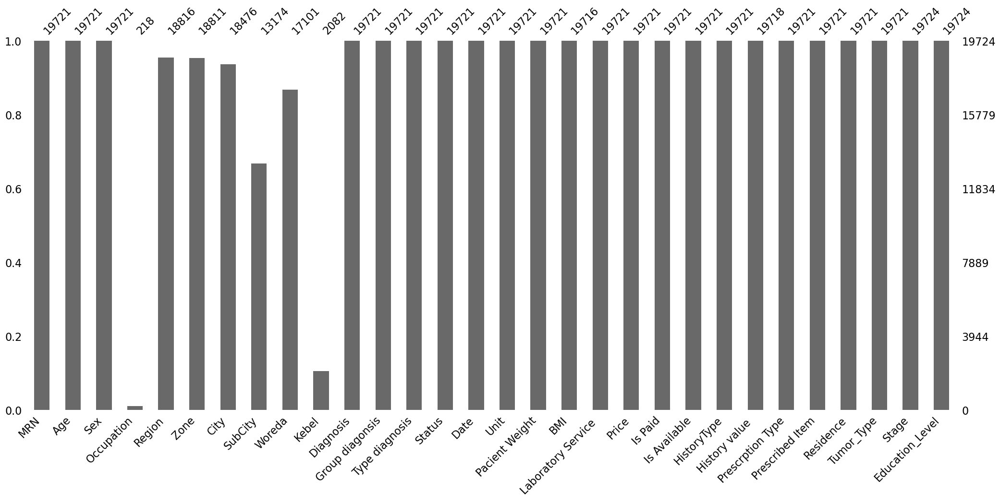

In [38]:
msno.bar(df)

In [39]:
df

,MRN,Age,Sex,Occupation,Region,Zone,City,SubCity,Woreda,Kebel,...,Is Paid,Is Available,HistoryType,History value,Prescrption Type,Prescribed Item,Residence,Tumor_Type,Stage,Education_Level
0,272161.0,50.0,Male,Self employee,"Southern Nations, Nationalities and Peoples",Gurage,Welkite,NaN,Welkite,NaN,...,1.0,1.0,HISTORY,Known cardiac pt on follow up on atenolol 25mg...,Prescription,"{""Name"":""paracetamol"",""Strength"":""10mg"",""Presc...",rural,Malignant,stage3,Illiterate
1,271933.0,45.0,Female,Self employee,Oromia,Oromia-Finfinne,BURAYU,NaN,BURAYU,NaN,...,1.0,1.0,HISTORY,c/c: BACK PAIN/01 month 45yrs old female pati...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""CEFTRIAXO...",rural,Malignant,stage3,Illiterate
2,272272.0,51.0,Female,Self employee,Addis Ababa,Addis Ababa,Addis Ababa,Yeka,1,NaN,...,1.0,1.0,HISTORY,P/E H.E.E.N.T: pink conjuctivae and NICS LGS:...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""PLASILE 1...",urban,Malignant,stage3,Illiterate
3,272380.0,72.0,Female,Self employee,Benshangul-Gumaz,Asosa,Asosa,NaN,Asosa,NaN,...,0.0,0.0,HISTORY,he is a 19 year old patient who had followup a...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""GLOVE "",""...",rural,Malignant,stage3,Primary Education
4,267125.0,60.0,Male,Self employee,"Southern Nations, Nationalities and Peoples",Gurage,GURAGE,NaN,ENDGJE,NaN,...,0.0,0.0,HISTORY,Known HTN with HHD and polycythemia pt and B.A...,Prescription,"{""PrescriptionType"":""Medication"",""Name"":""Olanz...",rural,Malignant,stage3,Illiterate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19719,10222.0,21.0,Male,NaN,NaN,NaN,NaN,KIRKOS,NaN,NaN,...,1.0,0.0,HISTORY,P: MDD + Conversion d/o Rx: Flouxetine 20mg PO...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""amoxacill...",rural,Benign,stage2,Unknown
19720,160158.0,29.0,Female,NaN,Addis Ababa,Addis Ababa,Addis Ababa,Kolfe,3,NaN,...,1.0,0.0,HISTORY,GDM + LATE 2ND TMP ON DIATERY MODIFICATION S...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""ns"",""Stre...",urban,Benign,stage2,Unknown
19721,NaN,NaN,NaN,farmer,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,stage2,Unknown
19722,NaN,NaN,NaN,Self_employes,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,stage2,Unknown


## Divide data into numeric and catagorical for further data anlasis and preprocessing accordgly 

In [40]:
# Identify numeric columns
numeric_col = df.select_dtypes(include=['number', 'float']).columns.tolist()

# Identify categorical columns
categorical_col = df.select_dtypes(include=['object', 'category', 'bool']).columns.tolist()

# Print the lists
print("Numeric columns:", numeric_col)
print("Categorical columns:", categorical_col)


Numeric columns: ['MRN', 'Age', 'Price', 'Is Paid', 'Is Available']
Categorical columns: ['Sex', 'Occupation', 'Region', 'Zone', 'City', 'SubCity', 'Woreda', 'Kebel', 'Diagnosis', 'Group diagonsis', 'Type diagnosis', 'Status', 'Date', 'Unit', 'Pacient Weight', 'BMI', 'Laboratory Service ', 'HistoryType', 'History value ', 'Prescrption Type', 'Prescribed Item', 'Residence', 'Tumor_Type', 'Stage', 'Education_Level']


In [41]:
Categorical_col=['Sex', 'Occupation', 'Region', 'Zone', 'City', 'SubCity', 'Woreda', 'Kebel', 'Diagnosis', 'Group diagonsis', 'Type diagnosis', 'Status', 'Date', 'Unit', 'Pacient Weight', 'BMI', 'Laboratory Service ', 'HistoryType', 'History value ', 'Prescrption Type', 'Prescribed Item', 'Residence', 'Tumor_Type', 'Stage', 'Education_Level']

In [42]:
Numeric_col=['MRN', 'Age', 'Price', 'Is Paid', 'Is Available']

# filling missing for categorical dataset Using:-
- mode
- Bfill
- Ffill
- constant
- interpolate

In [43]:
def fill_missing_values(df, method='mode'):
    """
    Fill missing values in categorical columns using the specified method.
    
    Parameters:
    df (pd.DataFrame): The DataFrame to process.
    method (str): The method to fill missing values ('mode', 'ffill', 'bfill', 'constant', 'least_frequent', 'interpolate').
    
    Returns:
    pd.DataFrame: The DataFrame with missing values filled.
    """
    for column in df.select_dtypes(include=['object', 'category']).columns:
        if method == 'mode':
            mode_value = df[column].mode()[0]
            df[column].fillna(mode_value, inplace=True)
        elif method == 'ffill':
            df[column].fillna(method='ffill', inplace=True)
        elif method == 'bfill':
            df[column].fillna(method='bfill', inplace=True)
        elif method == 'constant':
            df[column].fillna('Unknown', inplace=True)
        elif method == 'least_frequent':
            least_frequent = df[column].value_counts().idxmin()
            df[column].fillna(least_frequent, inplace=True)
        elif method == 'interpolate' and df[column].dtype.name == 'category':
            # Convert to ordered categorical and interpolate
            df[column] = df[column].cat.add_categories('Missing')
            df[column].fillna('Missing', inplace=True)
            df[column] = df[column].cat.codes.replace(-1, pd.NA).interpolate().astype(int)
            df[column] = pd.Categorical.from_codes(df[column], categories=df[column].cat.categories)
    
    return df

def process_excel_file(file_path, method='mode'):
    """
    Process an Excel file to fill missing values in categorical columns.
    
    Parameters:
    file_path (str): The path to the Excel file.
    method (str): The method to fill missing values ('mode', 'ffill', 'bfill', 'constant', 'least_frequent', 'interpolate').
    
    Returns:
    pd.DataFrame: The processed DataFrame.
    """
    # # Read the Excel file
    # df = pd.read_excel(file_path)
    
    # Fill missing values
    df_filled = fill_missing_values(df, method=method)
    
    return df_filled

# Example usage:
file_path = 'path_to_your_excel_file.xlsx'
method = 'mode'  # You can change this to 'ffill', 'bfill', 'constant', 'least_frequent', or 'interpolate'

# Process the Excel file and get the filled DataFrame
filled_df = process_excel_file(file_path, method=method)

# filling missing for Numerical Datasets
### Identifies numeric columns in the DataFrame.
#### Fills missing values using the specified method:
- 'mean': Fills with the mean of the column.
- 'median': Fills with the median of the column.
- 'mode': Fills with the most frequent value in the column.
- 'ffill': Forward fills missing values.
- 'bfill': Backward fills missing values.
- 'constant': Fills with a constant value (e.g., 0).
- 'knn': Uses K-Nearest Neighbors imputation to fill missing values. The number of neighbors can be specified with n_neighbors.

In [44]:
import pandas as pd
from sklearn.impute import KNNImputer

def fill_missing_numeric_values(df, method='mean', n_neighbors=5):
    """
    Fill missing values in numeric columns using the specified method.
    
    Parameters:
    df (pd.DataFrame): The DataFrame to process.
    method (str): The method to fill missing values ('mean', 'median', 'mode', 'ffill', 'bfill', 'constant', 'knn').
    n_neighbors (int): Number of neighboring samples to use for KNN imputation (used only if method='knn').
    
    Returns:
    pd.DataFrame: The DataFrame with missing values filled.
    """
    for column in df.select_dtypes(include=['number']).columns:
        if method == 'mean':
            df[column].fillna(df[column].mean(), inplace=True)
        elif method == 'median':
            df[column].fillna(df[column].median(), inplace=True)
        elif method == 'mode':
            df[column].fillna(df[column].mode()[0], inplace=True)
        elif method == 'ffill':
            df[column].fillna(method='ffill', inplace=True)
        elif method == 'bfill':
            df[column].fillna(method='bfill', inplace=True)
        elif method == 'constant':
            df[column].fillna(0, inplace=True)  # Replace 0 with any constant value you prefer
        elif method == 'knn':
            imputer = KNNImputer(n_neighbors=n_neighbors)
            df[df.select_dtypes(include=['number']).columns] = imputer.fit_transform(df.select_dtypes(include=['number']))
    
    return df

def process_excel_file(file_path, method='mean', n_neighbors=5):
    """
    Process an Excel file to fill missing values in numeric columns.
    
    Parameters:
    file_path (str): The path to the Excel file.
    method (str): The method to fill missing values ('mean', 'median', 'mode', 'ffill', 'bfill', 'constant', 'knn').
    n_neighbors (int): Number of neighboring samples to use for KNN imputation (used only if method='knn').
    
    Returns:
    pd.DataFrame: The processed DataFrame.
    """
    # # Read the Excel file
    # df = pd.read_excel(file_path)
    
    # Fill missing values in numeric columns
    df_filled = fill_missing_numeric_values(df, method=method, n_neighbors=n_neighbors)
    
    return df_filled

# Example usage:
file_path = 'path_to_your_excel_file.xlsx'
method = 'knn'  # You can change this to 'mean', 'median', 'mode', 'ffill', 'bfill', 'constant', or 'knn'
n_neighbors = 5  # Number of neighbors for KNN imputation

# Process the Excel file and get the filled DataFrame
filled_df = process_excel_file(file_path, method=method, n_neighbors=n_neighbors)

## AFter Fillging Missing values 

<Axes: >

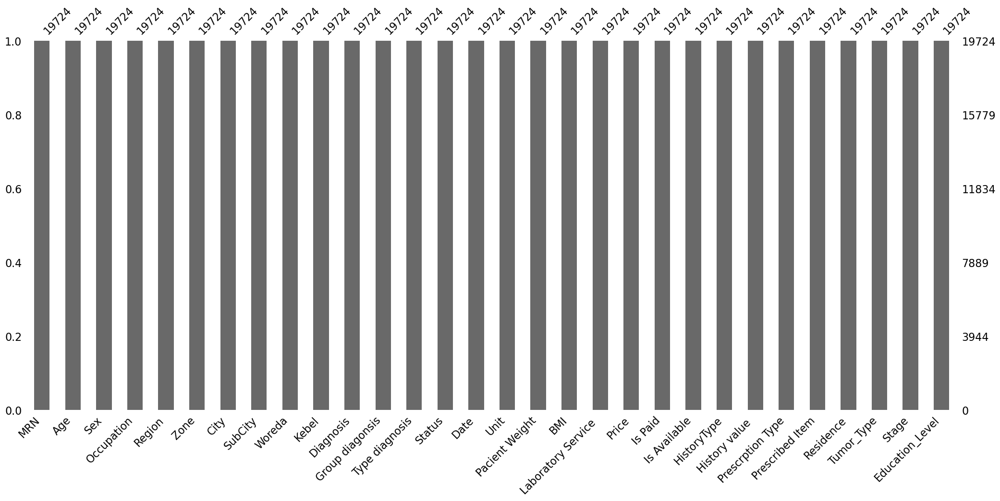

In [45]:
msno.bar(df)

# Identify the outlier form numerical datasets
 ### Visualizes outliers using three types of plots:
- Box Plot: Helps to visualize the distribution of the data and identify outliers.
- Histogram: Shows the frequency distribution of the data and can indicate the presence of outliers.
- Scatter Plot: Used to visualize the relationship between two numeric columns. If there's only one numeric column, it skips this plot.

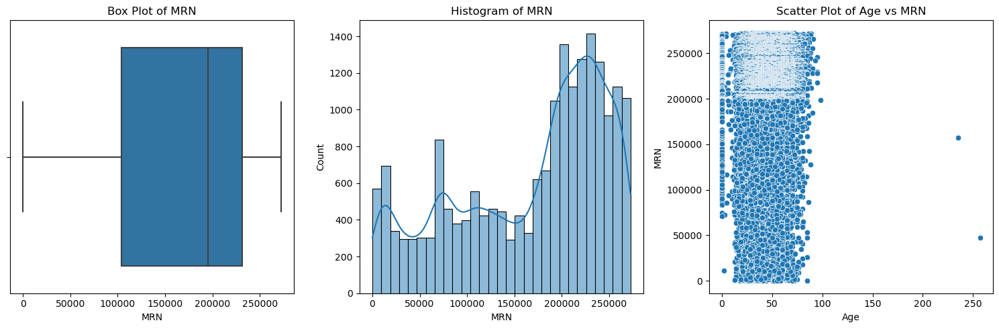

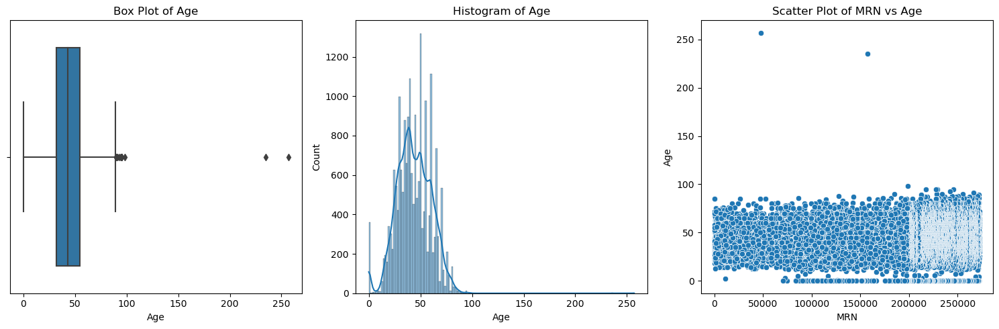

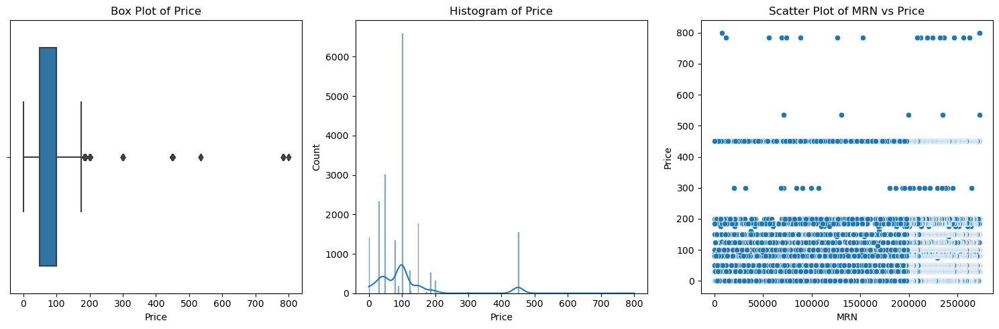

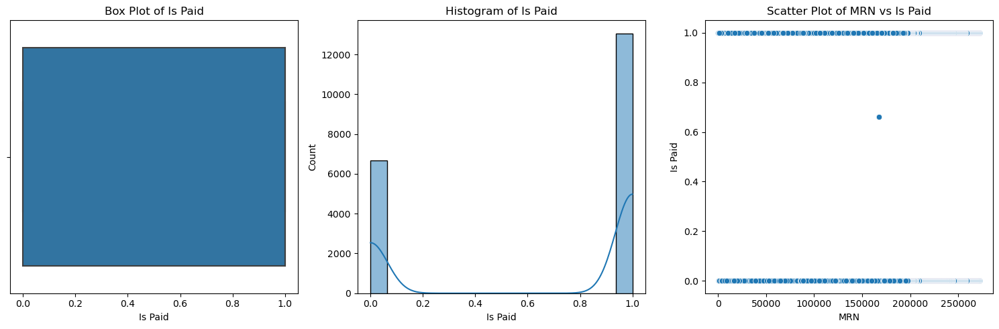

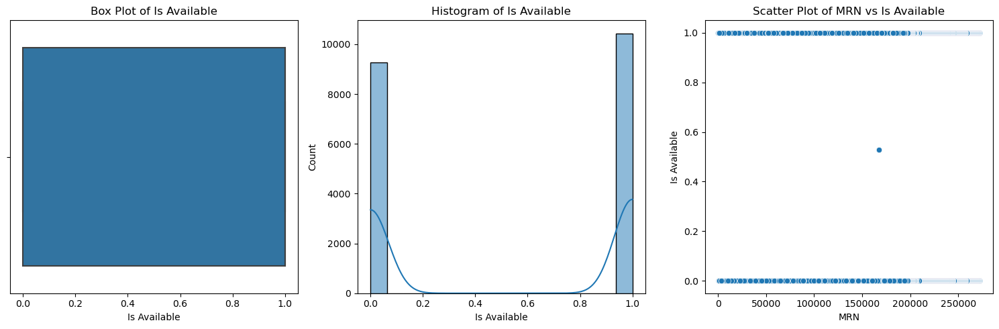

Outliers in numeric columns have been visualized.


In [46]:
def visualize_outliers(df):
    """
    Visualize outliers in numeric columns using box plots, scatter plots, and histograms.
    
    Parameters:
    df (pd.DataFrame): The DataFrame to process.
    
    Returns:
    None
    """
    numeric_columns = df.select_dtypes(include=['number']).columns

    for column in numeric_columns:
        plt.figure(figsize=(15, 5))

        # Box plot
        plt.subplot(1, 3, 1)
        sns.boxplot(x=df[column])
        plt.title(f'Box Plot of {column}')

        # Histogram
        plt.subplot(1, 3, 2)
        sns.histplot(df[column], kde=True)
        plt.title(f'Histogram of {column}')

        # Scatter plot (if there's another numeric column to pair with)
        if len(numeric_columns) > 1:
            plt.subplot(1, 3, 3)
            for other_column in numeric_columns:
                if other_column != column:
                    sns.scatterplot(x=df[other_column], y=df[column])
                    plt.title(f'Scatter Plot of {other_column} vs {column}')
                    break

        plt.tight_layout()
        plt.show()

def process_excel_file(file_path):
    """
    Process an Excel file to identify numeric columns and visualize outliers.
    
    Parameters:
    file_path (str): The path to the Excel file.
    
    Returns:
    pd.DataFrame: The DataFrame read from the Excel file.
    """
    # # Read the Excel file
    # df = pd.read_excel(file_path)
    
    # Visualize outliers in numeric columns
    visualize_outliers(df)
    
    return df

# Example usage:
file_path = 'path_to_your_excel_file.xlsx'

# Process the Excel file and visualize outliers
df = process_excel_file(file_path)

print("Outliers in numeric columns have been visualized.")


## Detects  and remove outliers using the specified method:
- 'z_score': Uses the Z-score method to detect outliers. A Z-score above the threshold (default 3) is considered an outlier.
- 'Inter quartel range': Uses the Interquartile Range (IQR) method to detect outliers. Values outside 1.5 times the IQR below the first quartile (Q1) or above the third quartile (Q3) are considered outliers.
### A. outlier datection and removale using Inter quartel range

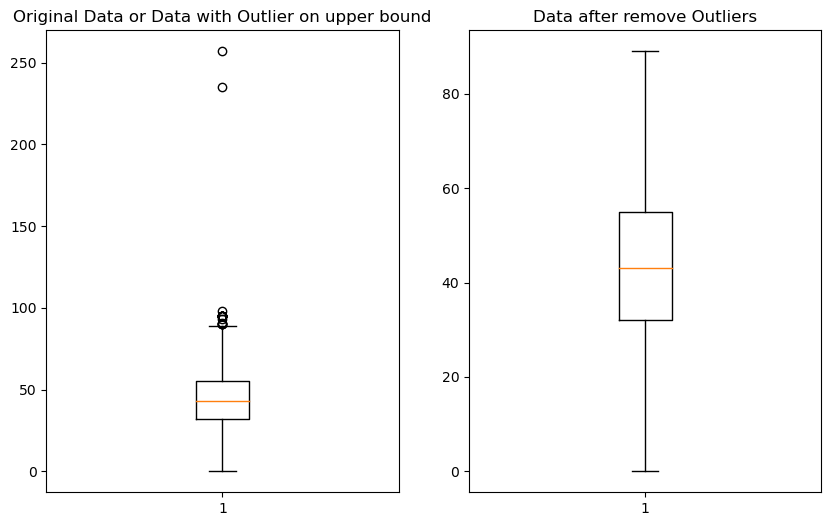

In [47]:
# Specify the column for which you want to remove outliers
column_name = 'Age'  # Replace with the name of your specific column

# Calculate the IQR (Interquartile Range)
Q1 = df[column_name].quantile(0.25)
Q3 = df[column_name].quantile(0.75)
IQR = Q3 - Q1

# Define the lower and upper bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Remove outliers and create a new DataFrame without outliers
df_no_outliers = df[(df[column_name] >= lower_bound) & (df[column_name] <= upper_bound)]

# Visualize the original and filtered data using a boxplot
plt.figure(figsize=(10, 6))

# Boxplot for the original data
plt.subplot(1, 2, 1)
plt.boxplot(df[column_name])
plt.title('Original Data or Data with Outlier on upper bound')

# Boxplot for the data without outliers
plt.subplot(1, 2, 2)
plt.boxplot(df_no_outliers[column_name])
plt.title('Data after remove Outliers')

plt.show()

### B. Outlier detections and remove using Z-score

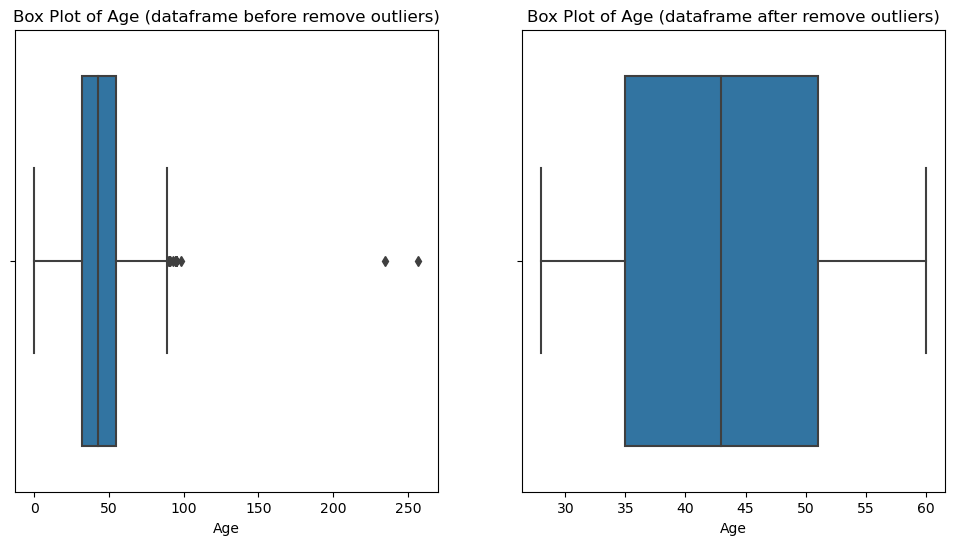

In [48]:
# Specify the column from which you want to remove outliers
column_name = 'Age'

# Calculate Z-scores for the specified column
z_scores = np.abs((df[column_name] - df[column_name].mean()) / df[column_name].std())

# Set a Z-score threshold (e.g., 3)
threshold = 1

# Identify and remove outliers
df_no_outliers = df[z_scores < threshold]

# Visualize the data before and after removing outliers using a box plot
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
sns.boxplot(x=df[column_name])
plt.title(f'Box Plot of {column_name} (dataframe before remove outliers)')

plt.subplot(1, 2, 2)
sns.boxplot(x=df_no_outliers[column_name])
plt.title(f'Box Plot of {column_name} (dataframe after remove outliers)')

plt.show()

## Check  any data redundancy or duplication

In [49]:
df.duplicated().sum()

0

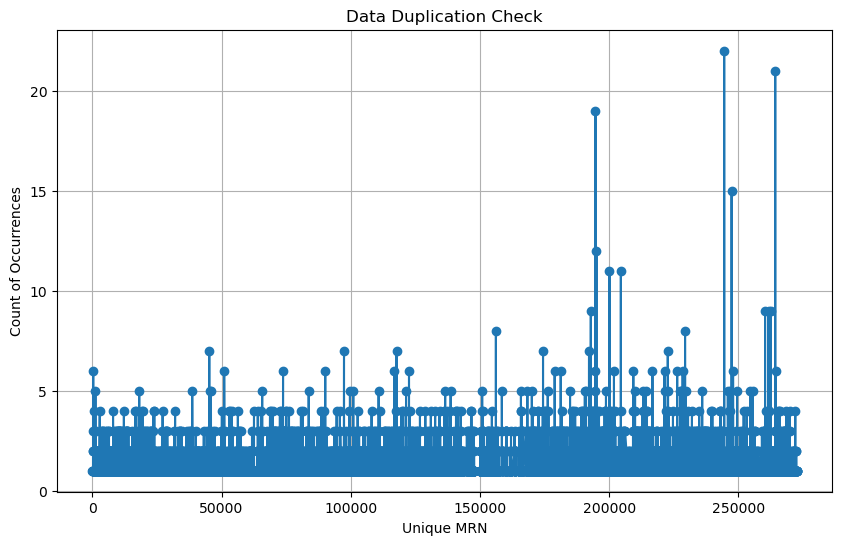

In [50]:
# Check the first few rows of the DataFrame to understand its structure
# print(df.head())

# Assume the unique identifier column is named 'id' (replace with your column name)
# Count occurrences of each unique entry
counts = df['MRN'].value_counts().sort_index()

# Plotting the line graph
plt.figure(figsize=(10, 6))
plt.plot(counts.index, counts.values, marker='o')
plt.title('Data Duplication Check')
plt.xlabel('Unique MRN')
plt.ylabel('Count of Occurrences')
plt.grid(True)
plt.show()


In [51]:
df['Tumor_Type'].value_counts()

Tumor_Type
Benign       10650
Malignant     9074
Name: count, dtype: int64

# Explanatory data analytics (EDA) 
## A. Catagorical data analysis
#### show distrbution credit accros the country on map
- from Region name we extract the latitude and longitude
- from Geopspatial data we extract shapes 
- we view the disribution of Tumor type on contry 
- identfy which region is mostly Tumor type which ink of tumor is belong to which region

Dropped 0 rows due to failed geocoding


C:\Users\Daveee\AppData\Local\Temp\ipykernel_8220\1379507735.py:66: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))


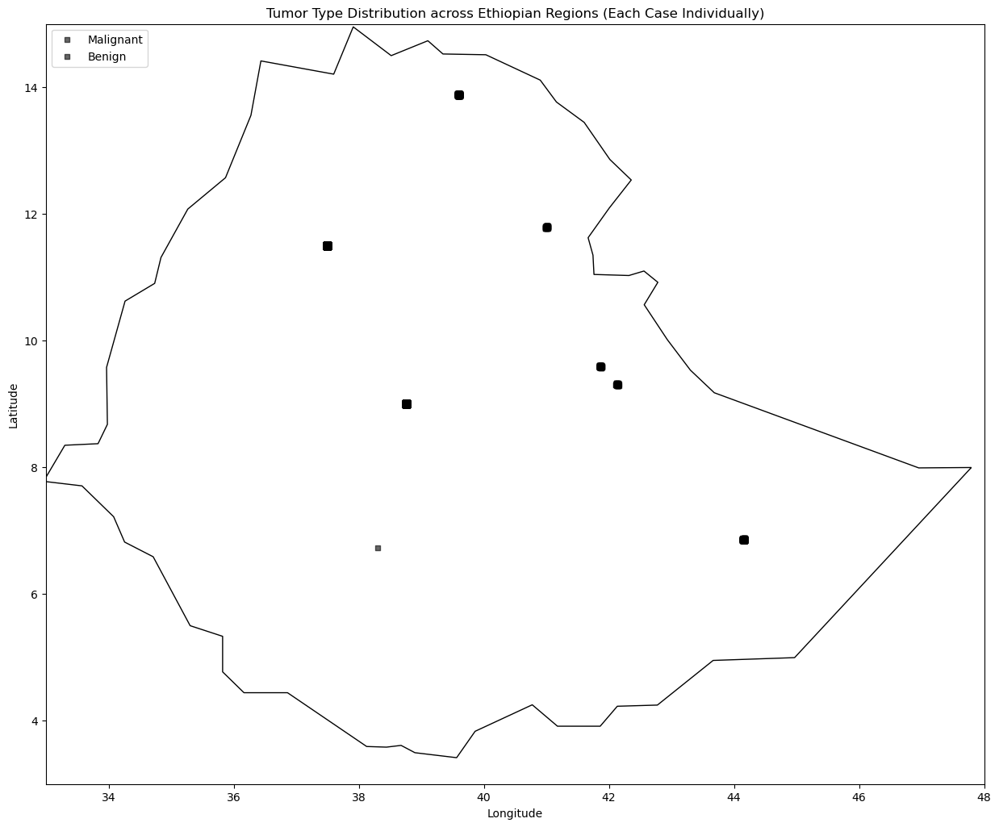

In [122]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import Point
import numpy as np

# # Load the medical dataset from an Excel file
# medical_file_path = 'medical_dataset.xlsx'  # Replace with the path to your medical dataset
# df = pd.read_excel(medical_file_path)

# Predefined dictionary of regions with their latitudes and longitudes
region_coordinates = {
    'ADDIS ABABA': (8.99999999940141, 38.76667),
    'AFAR': (11.79564, 41.003586),
    'AMHARA': (11.49999999953709, 37.5),
    'DIRE DAWA': (9.5931, 41.8661),
    'GAMBELLA': (7.810264699391271, 34.5805),
    'HARARI': (9.307, 42.135),
    'OROMIYA': (7.672164399392472, 36.835),
    'SOMALI': (6.857, 44.157),
    'South Ethiopia': (6.453652499423955, 37.742),
    'TIGRAY': (13.881272999776511, 39.6012),
    'CENTRAL ETHIOPIA': (6.453652499423955, 37.742),
    'BENSHANGUL GUMUZ': (10.42673, 34.28),
    'SIDAMA': (6.7371751, 38.3),
    'SOUTH WEST ETHIOPIA': (6.453652499423955, 37.742),
}

# Function to get latitude and longitude from region name
def get_lat_lon(region):
    region = region.strip().upper()
    return region_coordinates.get(region, (None, None))

# Apply the function to get latitudes and longitudes for each row in the dataset
df['Latitude'], df['Longitude'] = zip(*df['Region'].apply(get_lat_lon))

# Drop rows where geocoding failed
initial_row_count = df.shape[0]
df.dropna(subset=['Latitude', 'Longitude'], inplace=True)
dropped_row_count = initial_row_count - df.shape[0]
print(f"Dropped {dropped_row_count} rows due to failed geocoding")

# Count occurrences of each Tumor_Type per Region
counts_df = df.groupby(['Region', 'Tumor_Type']).size().reset_index(name='Count')

# Expand each row based on the 'Count' column to represent multiple occurrences
expanded_df = counts_df.loc[counts_df.index.repeat(counts_df['Count'])].reset_index(drop=True)

# Get latitudes and longitudes for the expanded dataset
expanded_df['Latitude'], expanded_df['Longitude'] = zip(*expanded_df['Region'].apply(get_lat_lon))

# Create a small random jitter for better visualization (avoiding overlap of points)
def add_jitter(lat, lon):
    jitter_strength = 0.02  # Adjust for more or less scatter
    lat_jitter = np.random.uniform(-jitter_strength, jitter_strength)
    lon_jitter = np.random.uniform(-jitter_strength, jitter_strength)
    return lat + lat_jitter, lon + lon_jitter

# Apply jitter to each row for plotting
expanded_df['Latitude'], expanded_df['Longitude'] = zip(*expanded_df.apply(lambda row: add_jitter(row['Latitude'], row['Longitude']), axis=1))

# Create a GeoDataFrame from the expanded DataFrame
gdf = gpd.GeoDataFrame(expanded_df, geometry=[Point(xy) for xy in zip(expanded_df.Longitude, expanded_df.Latitude)])

# Load a world map shapefile (this will include Ethiopia)
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))

# Filter for Ethiopia
ethiopia = world[world.name == "Ethiopia"]

# Plot the map
fig, ax = plt.subplots(1, 1, figsize=(15, 15))
ethiopia.plot(ax=ax, color='white', edgecolor='black')

# Define tumor types and corresponding colors for better visualization
tumor_types = df['Tumor_Type'].unique()
color_mapping = {
    'Malignant': 'blue',
    'Benign': 'red'
}

# Plot each individual row from the expanded dataset
for idx, row in gdf.iterrows():
    tumor_type = row['Tumor_Type']
    color = color_mapping.get(tumor_type, 'black')  # Color for Malignant/Benign
    marker = 'o' if tumor_type == 'Malignant' else 's'  # Circle for Malignant, Square for Benign

    # Plot each individual case (data point)
    ax.scatter(row['Longitude'], row['Latitude'], color=color, marker=marker, s=20, alpha=0.6)

# Add legend
plt.legend(['Malignant', 'Benign'], loc='upper left')

# Add titles and labels
plt.title('Tumor Type Distribution across Ethiopian Regions (Each Case Individually)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Adjust limits to zoom into Ethiopia's region
plt.xlim(33, 48)  # Longitude range for Ethiopia
plt.ylim(3, 15)  # Latitude range for Ethiopia

# Show the plot
plt.show()


In [92]:
df.loc[df.Education_Level == 'Unknown', 'Education_Level'] = 'Certificate and Above'

In [103]:
df['Residence'].value_counts()

Residence
rural    10031
urban     9693
Name: count, dtype: int64

In [24]:
df.columns

Index(['MRN', 'Age', 'Sex', 'Occupation', 'Region', 'Zone', 'City', 'SubCity',
       'Woreda', 'Kebel', 'Diagnosis', 'Group diagonsis', 'Type diagnosis',
       'Status', 'Date', 'Unit', 'Pacient Weight', 'BMI',
       'Laboratory Service ', 'Price', 'Is Paid', 'Is Available',
       'HistoryType', 'History value ', 'Prescrption Type', 'Prescribed Item',
       'Residence', 'Tumor_Type', 'Stage', 'Education_Level', 'Latitude',
       'Longitude'],
      dtype='object')

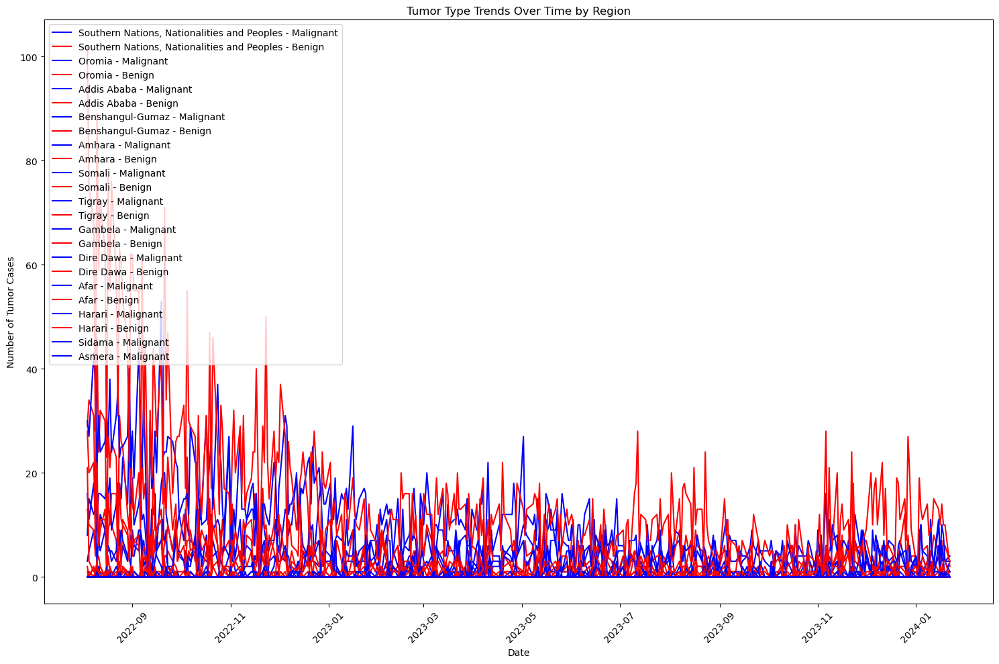

In [46]:
import pandas as pd
import matplotlib.pyplot as plt

# # Load the medical dataset from an Excel file
# medical_file_path = 'medical_dataset.xlsx'  # Replace with the path to your medical dataset
# df = pd.read_excel(medical_file_path)

# Ensure 'Date' column is in datetime format (assuming 'Diagnosis_Date' column exists)
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# # Check the dataset
# print(f"Loaded dataset with {df.shape[0]} rows and {df.shape[1]} columns")
# print(df.head())

# Group data by region, tumor type, and date, then count occurrences
grouped_data = df.groupby(['Date', 'Region', 'Tumor_Type']).size().reset_index(name='Count')

# Pivot the data to get Malignant and Benign counts separately for each region over time
pivot_data = grouped_data.pivot_table(index=['Date'], columns=['Region', 'Tumor_Type'], values='Count', fill_value=0)

# Plotting the time series for each region and tumor type
fig, ax = plt.subplots(figsize=(15, 10))

# Plot time series for each region and tumor type
for region in df['Region'].unique():
    if region in pivot_data.columns.levels[0]:
        if ('Malignant' in pivot_data[region].columns):
            ax.plot(pivot_data.index, pivot_data[region]['Malignant'], label=f'{region} - Malignant', color='blue')
        if ('Benign' in pivot_data[region].columns):
            ax.plot(pivot_data.index, pivot_data[region]['Benign'], label=f'{region} - Benign', color='red')

# Add titles and labels
plt.title('Tumor Type Trends Over Time by Region')
plt.xlabel('Date')
plt.ylabel('Number of Tumor Cases')

# Show the legend
plt.legend(loc='upper left')

# Show the plot
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

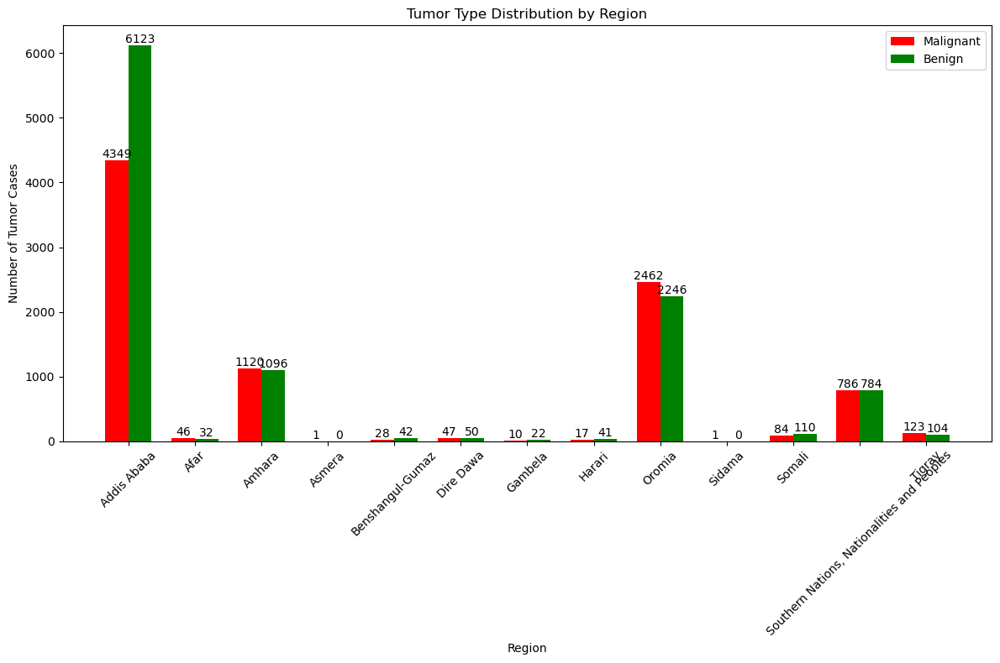

In [47]:
import pandas as pd
import matplotlib.pyplot as plt

# # Load the medical dataset from an Excel file
# medical_file_path = 'medical_dataset.xlsx'  # Replace with the path to your medical dataset
# df = pd.read_excel(medical_file_path)

# Ensure 'Date' column is in datetime format (assuming 'Diagnosis_Date' column exists)
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# # Check the dataset
# print(f"Loaded dataset with {df.shape[0]} rows and {df.shape[1]} columns")
# print(df.head())

# Group data by region and tumor type to count occurrences
grouped_data = df.groupby(['Region', 'Tumor_Type']).size().reset_index(name='Count')

# Pivot the data to make tumor types as columns for each region
pivot_data = grouped_data.pivot_table(index='Region', columns='Tumor_Type', values='Count', fill_value=0)

# Plotting the bar graph for tumor types in each region
fig, ax = plt.subplots(figsize=(12, 8))

# Define the positions of the bars
regions = pivot_data.index
bar_width = 0.35  # Width of each bar

# Define positions of the bar groups
index = range(len(regions))

# Plot bars for 'Malignant' and 'Benign'
malignant_bars = ax.bar(index, pivot_data['Malignant'], bar_width, label='Malignant', color='red')
benign_bars = ax.bar([i + bar_width for i in index], pivot_data['Benign'], bar_width, label='Benign', color='green')

# Add titles and labels
plt.title('Tumor Type Distribution by Region')
plt.xlabel('Region')
plt.ylabel('Number of Tumor Cases')

# Add x-axis labels for regions
plt.xticks([i + bar_width/2 for i in index], regions, rotation=45)

# Show the legend for tumor types
plt.legend(loc='upper right')

# Add values (count) on top of each bar
for bar in malignant_bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, height, f'{int(height)}', ha='center', va='bottom')

for bar in benign_bars:
    height = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, height, f'{int(height)}', ha='center', va='bottom')

# Show the plot
plt.tight_layout()
plt.show()


### To know which geneder is more attecked by cancer overtime and for which type of the tumour sever 
- Malignant
- Benign
- more of female Begin paciets more incresing over the time

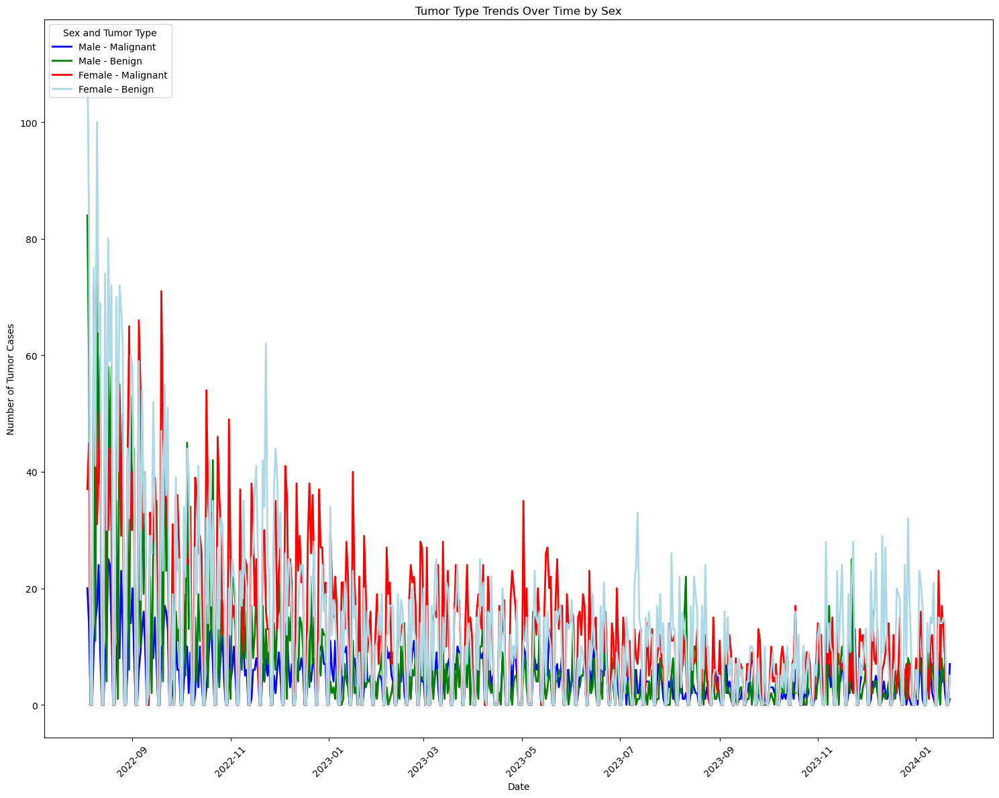

In [65]:
import pandas as pd
import matplotlib.pyplot as plt

# # Load the medical dataset from an Excel file
# medical_file_path = 'medical_dataset.xlsx'  # Replace with the path to your medical dataset
# df = pd.read_excel(medical_file_path)

# Ensure 'Date' column is in datetime format (assuming 'Date' column exists)
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# # Check the dataset
# print(f"Loaded dataset with {df.shape[0]} rows and {df.shape[1]} columns")
# print(df.head())

# Group data by date, sex, and tumor type to count occurrences
grouped_data = df.groupby(['Date', 'Sex', 'Tumor_Type']).size().reset_index(name='Count')

# Pivot the data to get counts separately for each sex and tumor type
pivot_data = grouped_data.pivot_table(index='Date', columns=['Sex', 'Tumor_Type'], values='Count', fill_value=0)

# Fill in missing dates to create a continuous time series
all_dates = pd.date_range(start=pivot_data.index.min(), end=pivot_data.index.max())
pivot_data = pivot_data.reindex(all_dates, fill_value=0)

# Plotting the time series for each sex and tumor type
fig, ax = plt.subplots(figsize=(15, 12))

# Define color mapping for each combination of sex and tumor type
color_mapping = {
    ('Male', 'Malignant'): 'blue',
    ('Male', 'Benign'): 'green',
    ('Female', 'Malignant'): 'red',
    ('Female', 'Benign'): 'lightblue'
}

# Plot time series for each sex and tumor type
for sex in df['Sex'].unique():
    for tumor_type in ['Malignant', 'Benign']:
        if (sex, tumor_type) in pivot_data.columns:
            ax.plot(pivot_data.index, pivot_data[(sex, tumor_type)], 
                    label=f'{sex} - {tumor_type}', 
                    color=color_mapping[(sex, tumor_type)], 
                    linestyle='-', linewidth=2)

# Add titles and labels
plt.title('Tumor Type Trends Over Time by Sex')
plt.xlabel('Date')
plt.ylabel('Number of Tumor Cases')

# Show the legend for tumor types and sex
plt.legend(loc='upper left', title='Sex and Tumor Type')

# Format x-axis for dates
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()


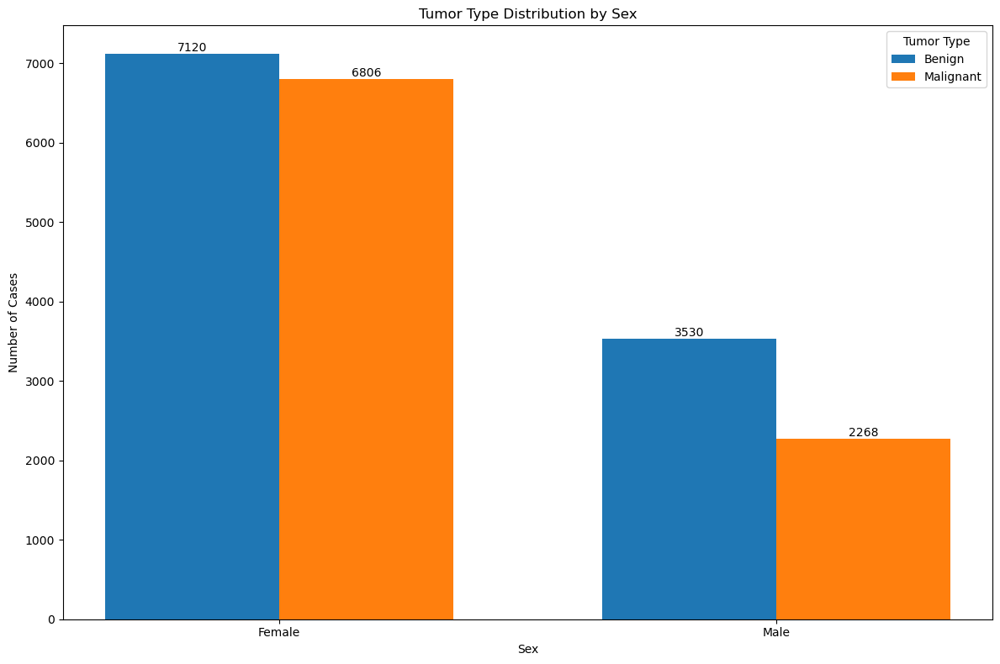

In [67]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the medical dataset from an Excel file
# medical_file_path = 'medical_dataset.xlsx'  # Replace with the path to your medical dataset
# df = pd.read_excel(medical_file_path)

# Ensure 'Tumor_Type' column exists in the dataset
# df should have columns: 'Sex', 'Tumor_Type'

# Group data by sex and tumor type to count occurrences
grouped_data = df.groupby(['Sex', 'Tumor_Type']).size().reset_index(name='Count')

# Pivot the data to make tumor types as columns for each sex
pivot_data = grouped_data.pivot_table(index='Sex', columns='Tumor_Type', values='Count', fill_value=0)

# Plotting the bar graph for tumor types by sex
fig, ax = plt.subplots(figsize=(12, 8))

# Define the positions of the bars
sex_labels = pivot_data.index
bar_width = 0.35  # Width of each bar
index = range(len(sex_labels))

# Plot bars for each tumor type
for i, tumor_type in enumerate(pivot_data.columns):
    bars = ax.bar([j + i * bar_width for j in index], pivot_data[tumor_type], bar_width, label=tumor_type)

    # Add counts on top of each bar
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width() / 2, height, f'{int(height)}', ha='center', va='bottom')

# Add titles and labels
plt.title('Tumor Type Distribution by Sex')
plt.xlabel('Sex')
plt.ylabel('Number of Cases')

# Add x-axis labels for sex
plt.xticks([j + (bar_width * (len(pivot_data.columns) - 1) / 2) for j in index], sex_labels)

# Show the legend for tumor types
plt.legend(title='Tumor Type')

# Show the plot
plt.tight_layout()
plt.show()


### Education_Level Vs tumor_type
- most illetrate peoples are more vuranlabel cancer 

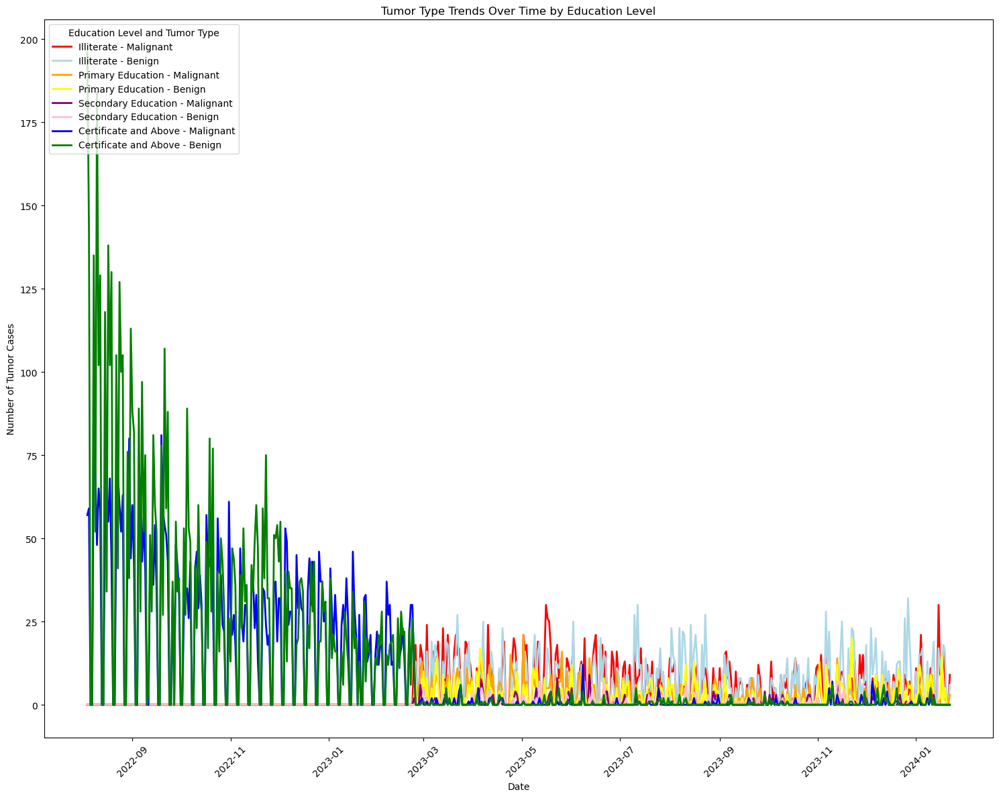

In [94]:
import pandas as pd
import matplotlib.pyplot as plt

# # Load the medical dataset from an Excel file
# medical_file_path = 'medical_dataset.xlsx'  # Replace with the path to your medical dataset
# df = pd.read_excel(medical_file_path)

# Ensure 'Date' column is in datetime format (assuming 'Date' column exists)
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# # Check the dataset
# print(f"Loaded dataset with {df.shape[0]} rows and {df.shape[1]} columns")
# print(df.head())

# Group data by date, education level, and tumor type to count occurrences
grouped_data = df.groupby(['Date', 'Education_Level', 'Tumor_Type']).size().reset_index(name='Count')

# Pivot the data to get counts separately for each education level and tumor type
pivot_data = grouped_data.pivot_table(index='Date', columns=['Education_Level', 'Tumor_Type'], values='Count', fill_value=0)

# Fill in missing dates to create a continuous time series
all_dates = pd.date_range(start=pivot_data.index.min(), end=pivot_data.index.max())
pivot_data = pivot_data.reindex(all_dates, fill_value=0)

# Plotting the time series for each education level and tumor type
fig, ax = plt.subplots(figsize=(15, 12))

# Define color mapping for each combination of education level and tumor type
color_mapping = {
    ('Certificate and Above', 'Malignant'): 'blue',
    ('Certificate and Above', 'Benign'): 'green',
    ('Illiterate', 'Malignant'): 'red',
    ('Illiterate', 'Benign'): 'lightblue',
    ('Primary Education', 'Malignant'): 'orange',
    ('Primary Education', 'Benign'): 'yellow',
    ('Secondary Education', 'Malignant'): 'purple',
    ('Secondary Education', 'Benign'): 'pink',
}

# Plot time series for each education level and tumor type
for education_level in df['Education_Level'].unique():
    for tumor_type in ['Malignant', 'Benign']:
        if (education_level, tumor_type) in pivot_data.columns:
            ax.plot(pivot_data.index, pivot_data[(education_level, tumor_type)], 
                    label=f'{education_level} - {tumor_type}', 
                    color=color_mapping[(education_level, tumor_type)], 
                    linestyle='-', linewidth=2)

# Add titles and labels
plt.title('Tumor Type Trends Over Time by Education Level')
plt.xlabel('Date')
plt.ylabel('Number of Tumor Cases')

# Show the legend for tumor types and education levels
plt.legend(loc='upper left', title='Education Level and Tumor Type')

# Format x-axis for dates
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()


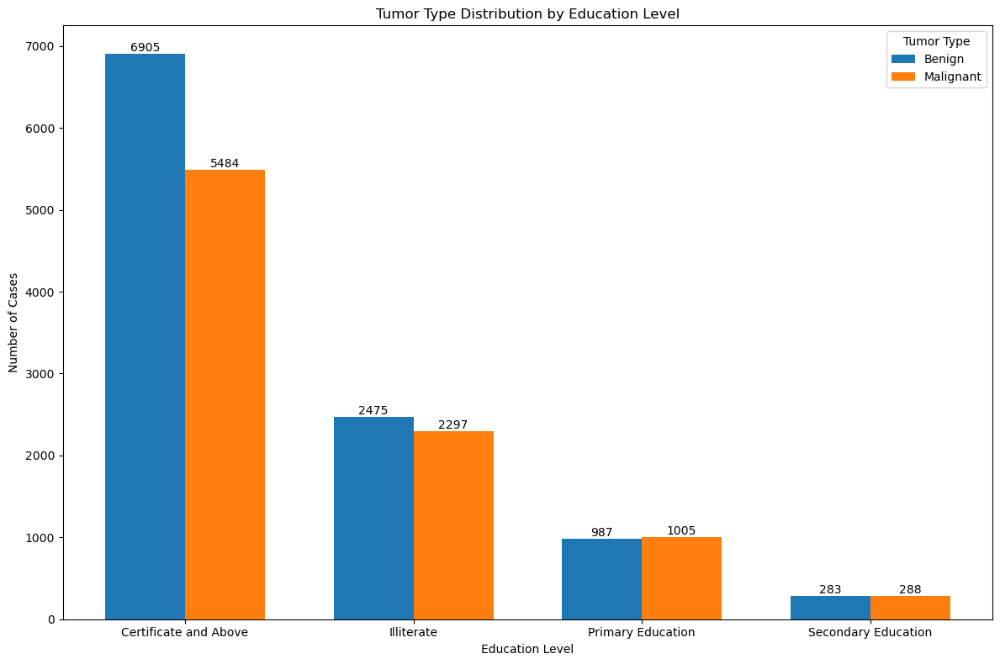

In [95]:
import pandas as pd
import matplotlib.pyplot as plt

# # Load the medical dataset from an Excel file
# medical_file_path = 'medical_dataset.xlsx'  # Replace with the path to your medical dataset
# df = pd.read_excel(medical_file_path)

# Group data by education level and tumor type to count occurrences
grouped_data = df.groupby(['Education_Level', 'Tumor_Type']).size().reset_index(name='Count')

# Pivot the data to make tumor types as columns for each education level
pivot_data = grouped_data.pivot(index='Education_Level', columns='Tumor_Type', values='Count').fillna(0)

# Plotting the bar graph for tumor types in each education level
fig, ax = plt.subplots(figsize=(12, 8))

# Define positions of the bar groups
index = range(len(pivot_data))
bar_width = 0.35  # Width of each bar

# Plot bars for each tumor type
for i, tumor_type in enumerate(pivot_data.columns):
    ax.bar([p + i * bar_width for p in index], pivot_data[tumor_type], bar_width, label=tumor_type)

# Add titles and labels
plt.title('Tumor Type Distribution by Education Level')
plt.xlabel('Education Level')
plt.ylabel('Number of Cases')

# Add x-axis labels for education levels
plt.xticks([p + bar_width * (len(pivot_data.columns) - 1) / 2 for p in index], pivot_data.index)

# Show the legend for tumor types
plt.legend(title='Tumor Type')

# Add values (count) on top of each bar
for i, tumor_type in enumerate(pivot_data.columns):
    for j, count in enumerate(pivot_data[tumor_type]):
        ax.text(j + i * bar_width, count + 0.5, f'{int(count)}', ha='center', va='bottom')

# Show the plot
plt.tight_layout()
plt.show()


## Residence vs tumor_type over the time 
- Both tumor_type are vuranvle in the Rular Resident


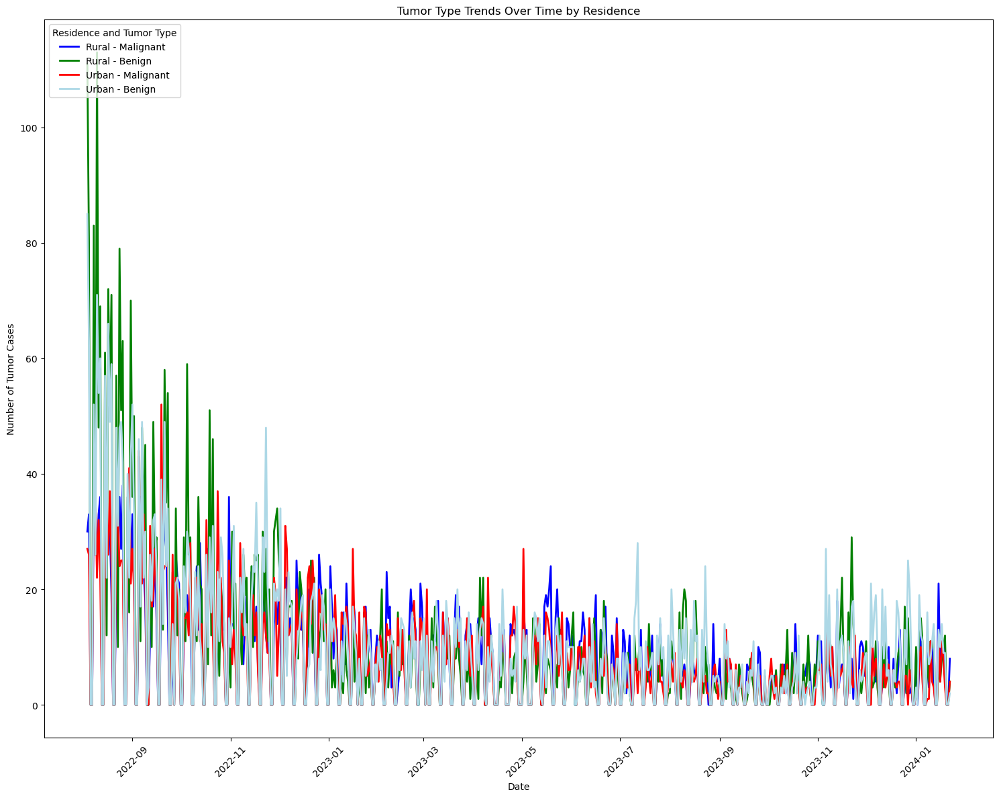

In [106]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the medical dataset from an Excel file
# medical_file_path = 'medical_dataset.xlsx'  # Replace with the path to your medical dataset
# df = pd.read_excel(medical_file_path)

# Ensure 'Date' column is in datetime format (assuming 'Date' column exists)
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# Normalize Residence and Tumor_Type columns to lowercase
df['Residence'] = df['Residence'].str.lower()
df['Tumor_Type'] = df['Tumor_Type'].str.lower()

# Group data by date, residence, and tumor type to count occurrences
grouped_data = df.groupby(['Date', 'Residence', 'Tumor_Type']).size().reset_index(name='Count')

# Pivot the data to get counts separately for each residence and tumor type
pivot_data = grouped_data.pivot_table(index='Date', columns=['Residence', 'Tumor_Type'], values='Count', fill_value=0)

# Fill in missing dates to create a continuous time series
all_dates = pd.date_range(start=pivot_data.index.min(), end=pivot_data.index.max())
pivot_data = pivot_data.reindex(all_dates, fill_value=0)

# # Print unique values for debugging
# print("Unique Residences:", df['Residence'].unique())
# print("Unique Tumor Types:", df['Tumor_Type'].unique())

# Plotting the time series for each residence and tumor type
fig, ax = plt.subplots(figsize=(15, 12))

# Define color mapping for tumor types
color_mapping = {
    ('rural', 'malignant'): 'blue',
    ('rural', 'benign'): 'green',
    ('urban', 'malignant'): 'red',
    ('urban', 'benign'): 'lightblue'
}

# Plot time series for each residence and tumor type
for residence in df['Residence'].unique():
    for tumor_type in ['malignant', 'benign']:
        if (residence, tumor_type) in pivot_data.columns:
            ax.plot(pivot_data.index, pivot_data[(residence, tumor_type)], 
                    label=f'{residence.capitalize()} - {tumor_type.capitalize()}', 
                    color=color_mapping[(residence, tumor_type)], 
                    linestyle='-', linewidth=2)

# Add titles and labels
plt.title('Tumor Type Trends Over Time by Residence')
plt.xlabel('Date')
plt.ylabel('Number of Tumor Cases')

# Show the legend for tumor types and residence
plt.legend(loc='upper left', title='Residence and Tumor Type')

# Format x-axis for dates
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()


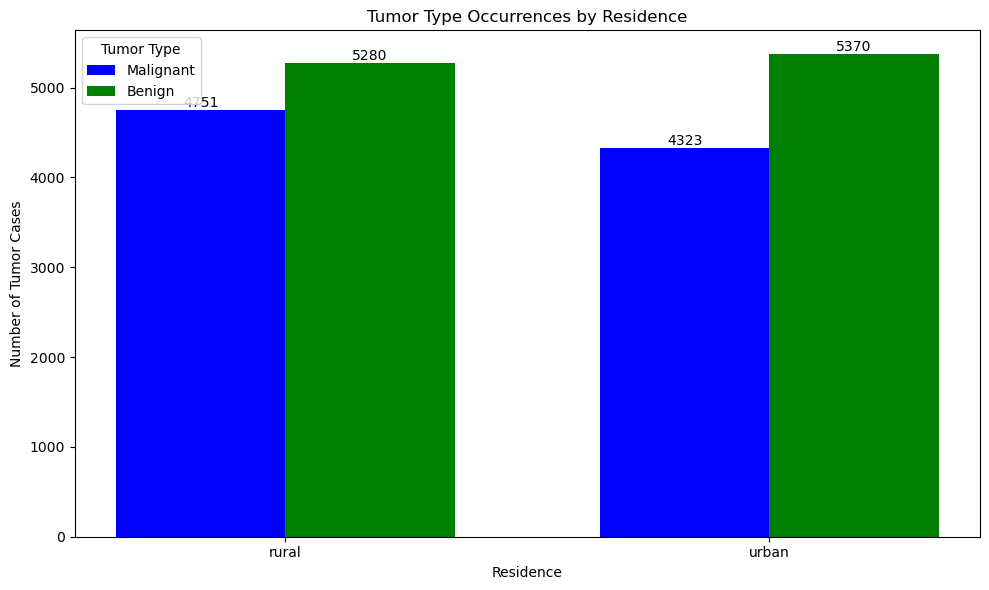

In [110]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the medical dataset from an Excel file
# medical_file_path = 'medical_dataset.xlsx'  # Replace with the path to your medical dataset
# df = pd.read_excel(medical_file_path)

# Ensure 'Date' column is in datetime format (assuming 'Date' column exists)
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# Normalize Residence and Tumor_Type columns to lowercase
df['Residence'] = df['Residence'].str.lower()
df['Tumor_Type'] = df['Tumor_Type'].str.lower()

# Group data by residence and tumor type to count occurrences
grouped_data = df.groupby(['Residence', 'Tumor_Type']).size().reset_index(name='Count')

# Create a pivot table for better visualization
pivot_data = grouped_data.pivot(index='Residence', columns='Tumor_Type', values='Count').fillna(0)

# Plotting the bar graph for each residence and tumor type
fig, ax = plt.subplots(figsize=(10, 6))

# Bar width
bar_width = 0.35  # Adjust bar width as necessary
index = range(len(pivot_data))  # X locations for the groups

# Create bars for each tumor type
bars1 = ax.bar(index, pivot_data['malignant'], bar_width, label='Malignant', color='blue')
bars2 = ax.bar([i + bar_width for i in index], pivot_data['benign'], bar_width, label='Benign', color='green')

# Add titles and labels
plt.title('Tumor Type Occurrences by Residence')
plt.xlabel('Residence')
plt.ylabel('Number of Tumor Cases')

# Set x-ticks and labels
ax.set_xticks([i + bar_width / 2 for i in index])  # Center the ticks
ax.set_xticklabels(pivot_data.index)

# Add legend
plt.legend(loc='upper left', title='Tumor Type')

# Add count labels on top of the bars
for bar in bars1:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

for bar in bars2:
    yval = bar.get_height()
    ax.text(bar.get_x() + bar.get_width()/2, yval, int(yval), ha='center', va='bottom')

plt.tight_layout()

# Show the plot
plt.show()


# Explanatory data analytics (EDA) 
## B. Numerical data analysis
### Age vs Tumor_type over the time 
- Age which group is more vulnerable either Beginen or Malignant cancrious 
- 36-50 age group was more  vulnerable Beginen tumor cancrious
- 51-61 age group also vulnerable Malignant tumor cancrious 

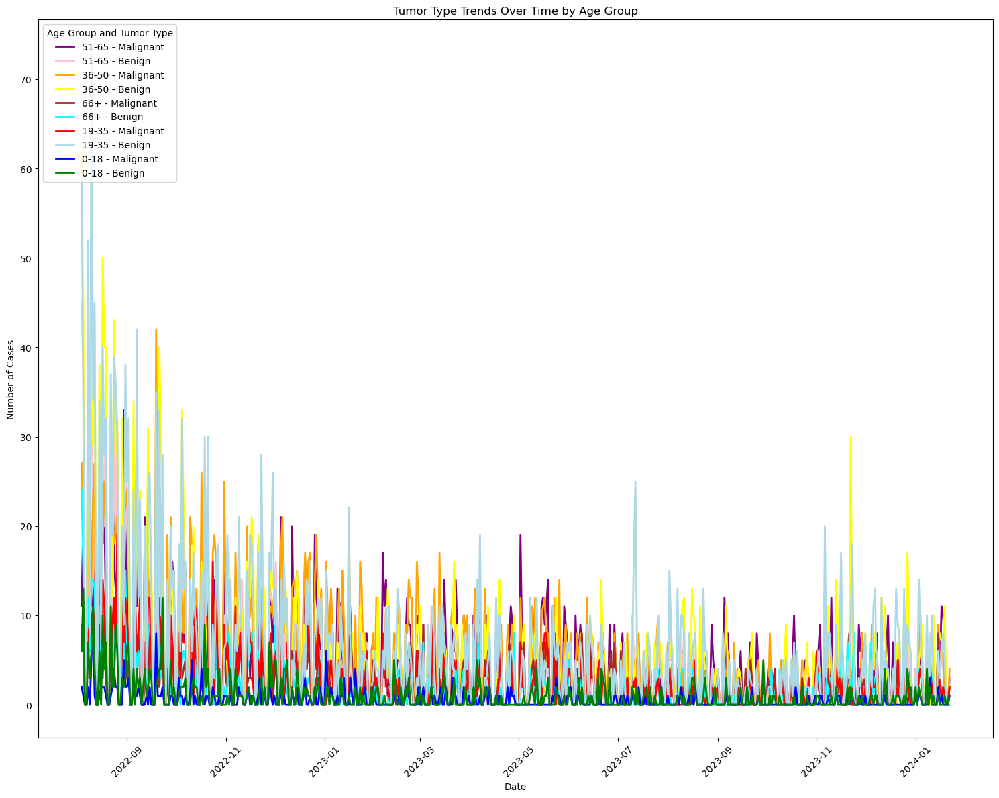

In [118]:
import pandas as pd
import matplotlib.pyplot as plt

# # Load the medical dataset from an Excel file
# medical_file_path = 'medical_dataset.xlsx'  # Replace with the path to your medical dataset
# df = pd.read_excel(medical_file_path)

# Ensure 'Date' column is in datetime format (assuming 'Date' column exists)
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# Define age groups
bins = [0, 18, 35, 50, 65, 100]
labels = ['0-18', '19-35', '36-50', '51-65', '66+']
df['Age_Group'] = pd.cut(df['Age'], bins=bins, labels=labels, right=False)

# Group data by date, age group, and tumor type to count occurrences
grouped_data = df.groupby(['Date', 'Age_Group', 'Tumor_Type']).size().reset_index(name='Count')

# Pivot the data to get counts separately for each age group and tumor type
pivot_data = grouped_data.pivot_table(index='Date', columns=['Age_Group', 'Tumor_Type'], values='Count', fill_value=0)

# Fill in missing dates to create a continuous time series
all_dates = pd.date_range(start=pivot_data.index.min(), end=pivot_data.index.max())
pivot_data = pivot_data.reindex(all_dates, fill_value=0)

# Plotting the time series for each age group and tumor type
fig, ax = plt.subplots(figsize=(15, 12))

# Define color mapping for each combination of age group and tumor type
color_mapping = {
    ('0-18', 'malignant'): 'blue',
    ('0-18', 'benign'): 'green',
    ('19-35', 'malignant'): 'red',
    ('19-35', 'benign'): 'lightblue',
    ('36-50', 'malignant'): 'orange',
    ('36-50', 'benign'): 'yellow',
    ('51-65', 'malignant'): 'purple',
    ('51-65', 'benign'): 'pink',
    ('66+', 'malignant'): 'brown',
    ('66+', 'benign'): 'cyan',
}

# Plot time series for each age group and tumor type
for age_group in df['Age_Group'].unique():
    for tumor_type in ['malignant', 'benign']:
        if (age_group, tumor_type) in pivot_data.columns:
            ax.plot(pivot_data.index, pivot_data[(age_group, tumor_type)], 
                    label=f'{age_group} - {tumor_type.capitalize()}', 
                    color=color_mapping.get((age_group, tumor_type), 'black'), 
                    linestyle='-', linewidth=2)

# Add titles and labels
plt.title('Tumor Type Trends Over Time by Age Group')
plt.xlabel('Date')
plt.ylabel('Number of Cases')

# Show the legend for tumor types and age groups
plt.legend(loc='upper left', title='Age Group and Tumor Type')

# Format x-axis for dates
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()


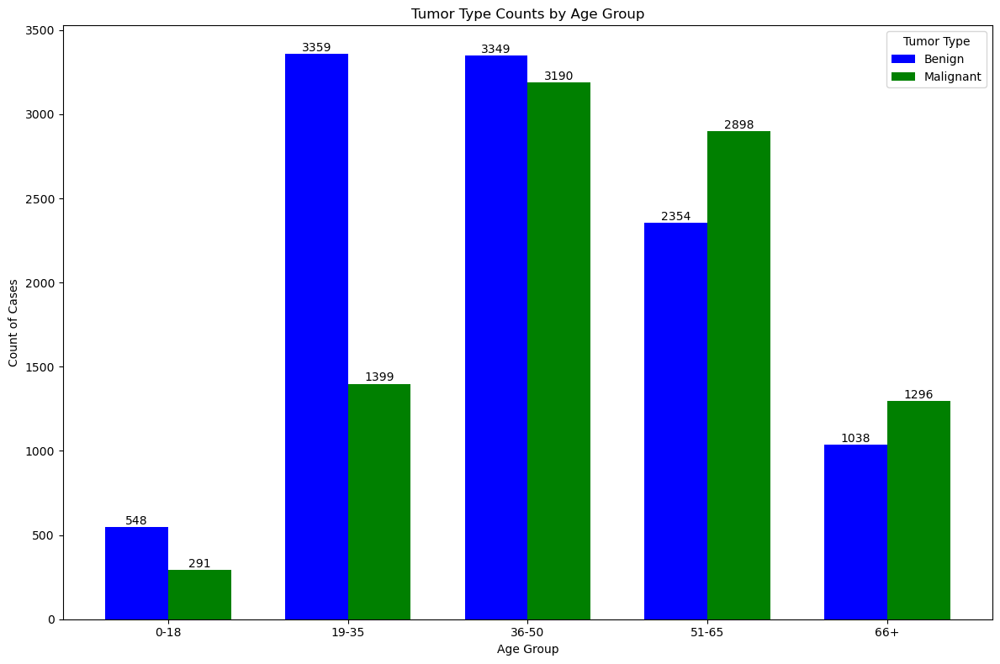

In [98]:
import pandas as pd
import matplotlib.pyplot as plt

# # Load the medical dataset from an Excel file
# medical_file_path = 'medical_dataset.xlsx'  # Replace with the path to your medical dataset
# df = pd.read_excel(medical_file_path)

# Define age groups
bins = [0, 18, 35, 50, 65, 100]
labels = ['0-18', '19-35', '36-50', '51-65', '66+']
df['Age_Group'] = pd.cut(df['Age'], bins=bins, labels=labels, right=False)

# Group data by age group and tumor type to count occurrences
grouped_data = df.groupby(['Age_Group', 'Tumor_Type']).size().reset_index(name='Count')

# Pivot the data to get counts separately for each age group and tumor type
pivot_data = grouped_data.pivot(index='Age_Group', columns='Tumor_Type', values='Count').fillna(0)

# Plotting the bar graph
fig, ax = plt.subplots(figsize=(12, 8))

# Define colors for each tumor type
colors = ['blue', 'green']  # Assuming two tumor types: Malignant and Benign

# Create bar width
bar_width = 0.35

# Define the positions of the bars on the x-axis
positions = range(len(pivot_data))

# Plot bars for each tumor type
for i, tumor_type in enumerate(pivot_data.columns):
    ax.bar([p + bar_width * i for p in positions], 
           pivot_data[tumor_type], 
           width=bar_width, 
           label=tumor_type, 
           color=colors[i])

# Add titles and labels
plt.title('Tumor Type Counts by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Count of Cases')

# Add the count numbers on top of the bars
for i in range(len(pivot_data)):
    for j, tumor_type in enumerate(pivot_data.columns):
        count = pivot_data[tumor_type][i]
        ax.text(i + bar_width * j, count + 0.5, int(count), ha='center', va='bottom')

# Set x-axis ticks and labels
ax.set_xticks([p + bar_width / 2 for p in positions])  # Center ticks for groups
ax.set_xticklabels(pivot_data.index)

# Show the legend for tumor types
plt.legend(title='Tumor Type')

# Show the plot
plt.tight_layout()
plt.show()


## Price vs tumor_type
- Malignant tumor cancioour required more price compared to Begnin tumor canciour 

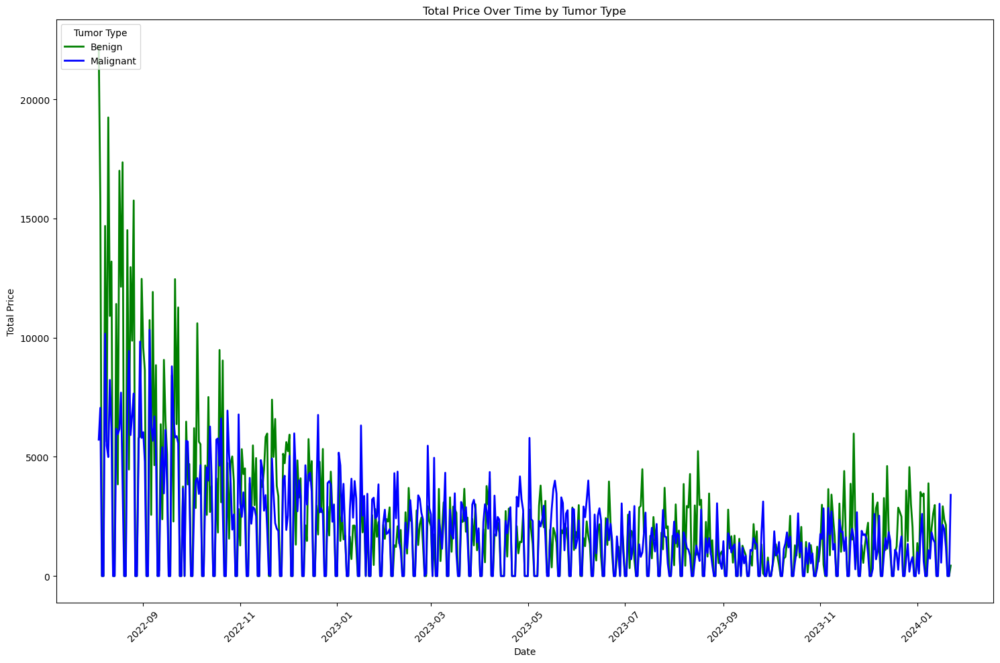

In [99]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the medical dataset from an Excel file
# medical_file_path = 'medical_dataset.xlsx'  # Replace with the path to your medical dataset
# df = pd.read_excel(medical_file_path)

# Ensure 'Date' column is in datetime format (assuming 'Date' column exists)
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# Group data by date and tumor type to calculate total price
grouped_data = df.groupby(['Date', 'Tumor_Type'])['Price'].sum().reset_index()

# Pivot the data to get total prices separately for each tumor type
pivot_data = grouped_data.pivot(index='Date', columns='Tumor_Type', values='Price').fillna(0)

# Fill in missing dates to create a continuous time series
all_dates = pd.date_range(start=pivot_data.index.min(), end=pivot_data.index.max())
pivot_data = pivot_data.reindex(all_dates, fill_value=0)

# Plotting the time series for each tumor type
fig, ax = plt.subplots(figsize=(15, 10))

# Define color mapping for tumor types
color_mapping = {
    'Malignant': 'blue',
    'Benign': 'green'
}

# Plot time series for each tumor type
for tumor_type in pivot_data.columns:
    ax.plot(pivot_data.index, pivot_data[tumor_type], 
            label=tumor_type, 
            color=color_mapping.get(tumor_type, 'black'), 
            linestyle='-', linewidth=2)

# Add titles and labels
plt.title('Total Price Over Time by Tumor Type')
plt.xlabel('Date')
plt.ylabel('Total Price')

# Show the legend for tumor types
plt.legend(loc='upper left', title='Tumor Type')

# Format x-axis for dates
plt.xticks(rotation=45)
plt.tight_layout()

# Show the plot
plt.show()

## Begnin tumor canrious was increse over the time

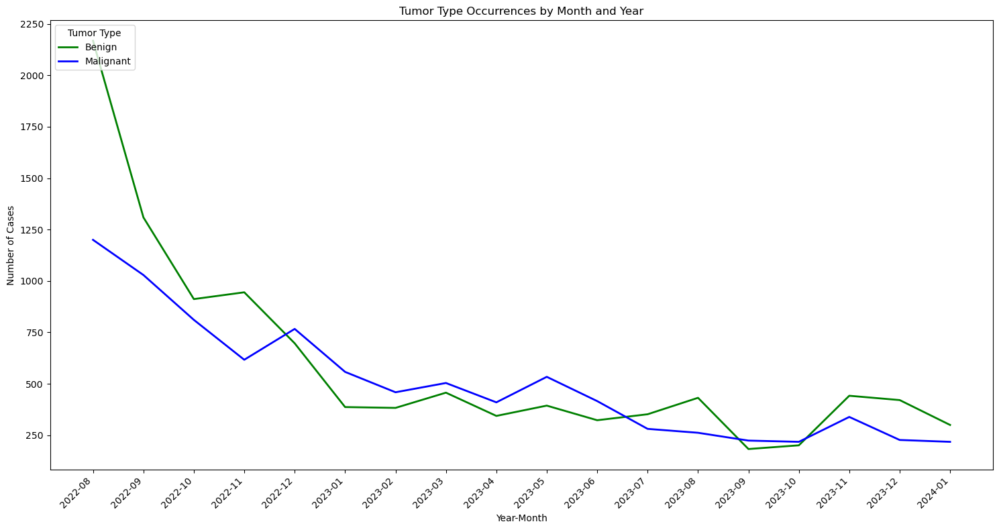

In [119]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the medical dataset from an Excel file
# medical_file_path = 'medical_dataset.xlsx'  # Replace with the path to your medical dataset
# df = pd.read_excel(medical_file_path)

# Ensure 'Date' column is in datetime format (assuming 'Date' column exists)
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# Extract both year and month from the date and create a new column for it
df['YearMonth'] = df['Date'].dt.to_period('M')  # This creates 'YYYY-MM' format

# Group data by YearMonth and tumor type to calculate total occurrences
grouped_data = df.groupby(['YearMonth', 'Tumor_Type']).size().reset_index(name='Count')

# Pivot the data to get counts separately for each tumor type
pivot_data = grouped_data.pivot(index='YearMonth', columns='Tumor_Type', values='Count').fillna(0)

# Ensure continuous time series across all YearMonth values in the dataset
all_year_months = pd.period_range(start=pivot_data.index.min(), end=pivot_data.index.max(), freq='M')
pivot_data = pivot_data.reindex(all_year_months, fill_value=0)

# Plotting the total occurrences for each tumor type by YearMonth
fig, ax = plt.subplots(figsize=(15, 8))

# Define color mapping for tumor types
color_mapping = {
    'malignant': 'blue',
    'benign': 'green'
}

# Plot total occurrences for each tumor type
for tumor_type in pivot_data.columns:
    ax.plot(pivot_data.index.astype(str), pivot_data[tumor_type], 
            label=tumor_type.capitalize(), 
            color=color_mapping.get(tumor_type.lower(), 'black'), 
            linestyle='-', linewidth=2)

# Add titles and labels
plt.title('Tumor Type Occurrences by Month and Year')
plt.xlabel('Year-Month')
plt.ylabel('Number of Cases')

# Show the legend for tumor types
plt.legend(loc='upper left', title='Tumor Type')

# Format x-axis for better visibility
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Show the plot
plt.show()


# Total years day ove the time 
- more of the Benin tumor cancrious are inceasing over the time 

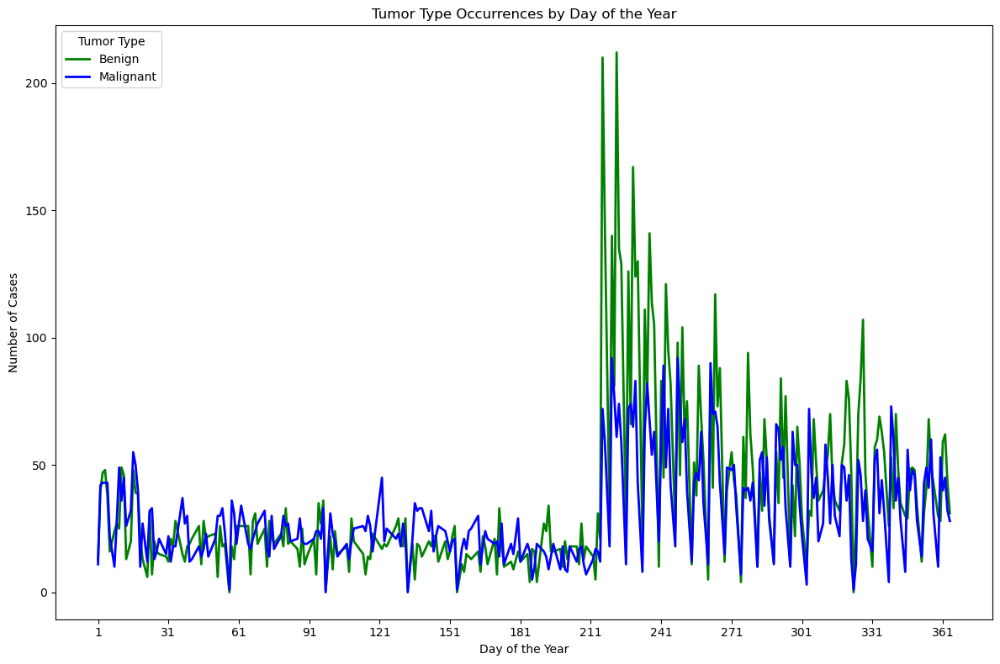

In [100]:
import pandas as pd
import matplotlib.pyplot as plt

# Load the medical dataset from an Excel file
# medical_file_path = 'medical_dataset.xlsx'  # Replace with the path to your medical dataset
# df = pd.read_excel(medical_file_path)

# Ensure 'Date' column is in datetime format (assuming 'Date' column exists)
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# Extract the day of the year from the date and create a new column for it
df['Day_of_Year'] = df['Date'].dt.dayofyear

# Group data by day of the year and tumor type to calculate total occurrences
grouped_data = df.groupby(['Day_of_Year', 'Tumor_Type']).size().reset_index(name='Count')

# Pivot the data to get counts separately for each tumor type
pivot_data = grouped_data.pivot(index='Day_of_Year', columns='Tumor_Type', values='Count').fillna(0)

# Plotting the total occurrences for each tumor type by day of the year
fig, ax = plt.subplots(figsize=(12, 8))

# Define color mapping for tumor types
color_mapping = {
    'Malignant': 'blue',
    'Benign': 'green'
}

# Plot total occurrences for each tumor type
for tumor_type in pivot_data.columns:
    ax.plot(pivot_data.index, pivot_data[tumor_type], 
            label=tumor_type, 
            color=color_mapping.get(tumor_type, 'black'), 
            linestyle='-', linewidth=2)

# Add titles and labels
plt.title('Tumor Type Occurrences by Day of the Year')
plt.xlabel('Day of the Year')
plt.ylabel('Number of Cases')

# Show the legend for tumor types
plt.legend(loc='upper left', title='Tumor Type')

# Format x-axis for better visibility
plt.xticks(range(1, 366, 30))  # Show every 30 days (adjust as necessary)
plt.tight_layout()

# Show the plot
plt.show()


In [48]:
df.columns

Index(['MRN', 'Age', 'Sex', 'Occupation', 'Region', 'Zone', 'City', 'SubCity',
       'Woreda', 'Kebel', 'Diagnosis', 'Group diagonsis', 'Type diagnosis',
       'Status', 'Date', 'Unit', 'Pacient Weight', 'BMI',
       'Laboratory Service ', 'Price', 'Is Paid', 'Is Available',
       'HistoryType', 'History value ', 'Prescrption Type', 'Prescribed Item',
       'Residence', 'Tumor_Type', 'Stage', 'Education_Level'],
      dtype='object')

# ****Phase II****

## Model Development  Using the following algorithms  
- Random forest, 
- XGBoost, 
- LightBoost, 
- CatBoost 
- LSTM
- MLPNN
## Model Evalution
- Accuracy 
- presion
- Recall
- F1-score
- ROC
### Model Expalnantion using Exaplanable AI such as:
- SHAP (SHapley Additive exPlanations) and
- LIME (Local Interpretable Model-agnostic Explanations)

In [52]:
df.drop(['MRN'],axis=1, inplace=True)

In [53]:
# df.drop(['Kebel'],axis=1, inplace=True)

In [54]:
from datetime import datetime

# Assuming the dataset is in a pandas DataFrame called df and the date column is named 'Date'
# Convert the 'Date' column to datetime if it's not already
df['Date'] = pd.to_datetime(df['Date'])

# Define the start date (November 1, 2022) and end date (January 22, 2024)
start_date = '2022-11-01'
end_date = '2024-01-22'

# Filter the dataset for dates between start_date and end_date
df = df[(df['Date'] >= start_date) & (df['Date'] <= end_date)]
df

,Age,Sex,Occupation,Region,Zone,City,SubCity,Woreda,Kebel,Diagnosis,...,Is Paid,Is Available,HistoryType,History value,Prescrption Type,Prescribed Item,Residence,Tumor_Type,Stage,Education_Level
0,50.0,Male,Self employee,"Southern Nations, Nationalities and Peoples",Gurage,Welkite,Kolfe,Welkite,1,Malignant neoplasm of rectum,...,1.0,1.0,HISTORY,Known cardiac pt on follow up on atenolol 25mg...,Prescription,"{""Name"":""paracetamol"",""Strength"":""10mg"",""Presc...",rural,Malignant,stage3,Illiterate
1,45.0,Female,Self employee,Oromia,Oromia-Finfinne,BURAYU,Kolfe,BURAYU,1,"Malignant neoplasm of liver, primary, unspecif...",...,1.0,1.0,HISTORY,c/c: BACK PAIN/01 month 45yrs old female pati...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""CEFTRIAXO...",rural,Malignant,stage3,Illiterate
2,51.0,Female,Self employee,Addis Ababa,Addis Ababa,Addis Ababa,Yeka,1,1,Malignant neoplasm of exocervix,...,1.0,1.0,HISTORY,P/E H.E.E.N.T: pink conjuctivae and NICS LGS:...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""PLASILE 1...",urban,Malignant,stage3,Illiterate
3,72.0,Female,Self employee,Benshangul-Gumaz,Asosa,Asosa,Kolfe,Asosa,1,Malignant neoplasm of exocervix,...,0.0,0.0,HISTORY,he is a 19 year old patient who had followup a...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""GLOVE "",""...",rural,Malignant,stage3,Primary Education
4,60.0,Male,Self employee,"Southern Nations, Nationalities and Peoples",Gurage,GURAGE,Kolfe,ENDGJE,1,Malignant neoplasm of body of stomach,...,0.0,0.0,HISTORY,Known HTN with HHD and polycythemia pt and B.A...,Prescription,"{""PrescriptionType"":""Medication"",""Name"":""Olanz...",rural,Malignant,stage3,Illiterate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12290,66.0,Female,farmer,Addis Ababa,Addis Ababa,Addis Ababa,Addis Ketema,9,1,Malignant neoplasm of exocervix,...,1.0,1.0,HISTORY,Patient also requested a note that he is surgi...,Prescription,"{""PrescriptionType"":""Medication"",""Name"":""PREDI...",urban,Malignant,stage3,Unknown
12291,45.0,Female,farmer,Addis Ababa,Addis Ababa,Addis Ababa,Nifas Silk,2,1,Malignant neoplasm of unspecified site of left...,...,1.0,1.0,MANAGEMENT,TO USRC,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""lidocain""...",urban,Malignant,stage3,Unknown
12292,60.0,Female,farmer,Addis Ababa,Addis Ababa,Addis Ababa,Lideta,4,29,Incomplete uterovaginal prolapse,...,1.0,0.0,MANAGEMENT,to GI SRC,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""s.glove"",...",urban,Benign,stage2,Unknown
12293,50.0,Female,farmer,Addis Ababa,Addis Ababa,Addis Ababa,Addis Ketema,8,1,Malignant neoplasm of exocervix,...,1.0,1.0,HISTORY,28yrs old female presnted with- headache an...,Prescription,"{""PrescriptionType"":""Supply"",""Name"":""surgical ...",urban,Malignant,stage3,Unknown


# Random forest 

Accuracy: 0.9845465636437576
Precision: 0.9886271324126726
Recall: 0.9806607574536664
F1 Score: 0.9846278317152104
ROC AUC: 0.9984003048550549


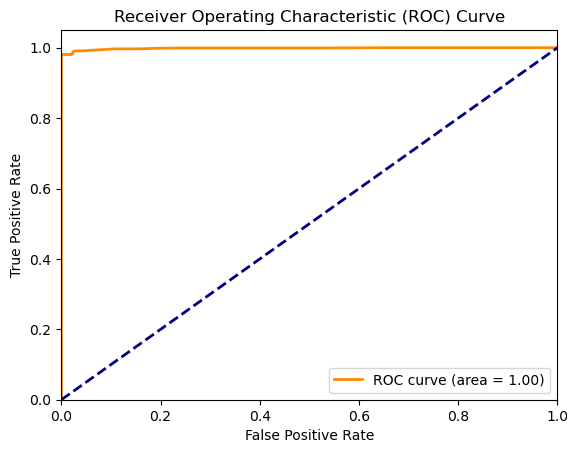

In [23]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt

def preprocess_data(df):
    # Exclude datetime columns
    non_datetime_cols = df.select_dtypes(exclude=['datetime64']).columns
    X = df[non_datetime_cols]

    # Separate features and target variable
    X = X.drop('Tumor_Type', axis=1)  # Assuming 'Tumor_Type' is the target column
    y = df['Tumor_Type']

    # Encode categorical variables
    X = pd.get_dummies(X, drop_first=True)

    # Encode target variable if it's categorical
    if y.dtype == 'object':
        le = LabelEncoder()
        y = le.fit_transform(y)  # Encodes 'Malignant' as 1 and 'Benign' as 0 (by default)

    # Standardize numerical features
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    return X, y

# Assuming df is already loaded
X, y = preprocess_data(df)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train Random Forest model
rf_model = RandomForestClassifier(random_state=42)
rf_model.fit(X_train, y_train)

# Evaluate model
y_pred = rf_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, rf_model.predict_proba(X_test)[:, 1])

# Print metrics
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'ROC AUC: {roc_auc}')

# Plot ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test, rf_model.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# XGBoost 

Accuracy: 0.9934932899552664
Precision: 0.9983726606997559
Recall: 0.9887187751813054
F1 Score: 0.9935222672064777
ROC AUC: 0.9973880908055239


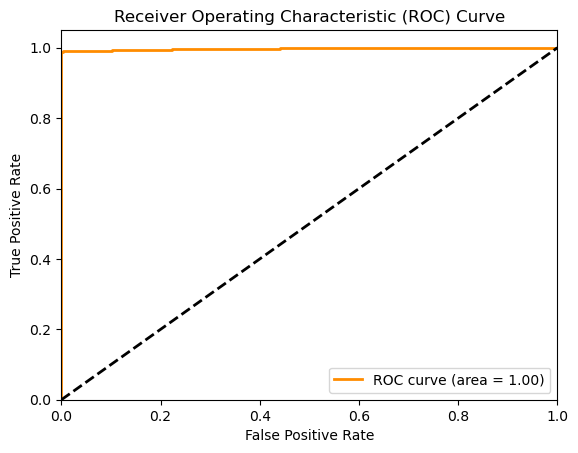

In [24]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc
from xgboost import XGBClassifier
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

def preprocess_data(df):
    # Exclude datetime columns
    non_datetime_cols = df.select_dtypes(exclude=['datetime64']).columns
    X = df[non_datetime_cols]

    # Separate features and target variable
    X = X.drop('Tumor_Type', axis=1)  # Replace 'Tumor_Type' as the target column
    y = df['Tumor_Type']

    # Encode categorical variables
    X = pd.get_dummies(X, drop_first=True)

    # Encode target variable (Malignant/Benign)
    le = LabelEncoder()
    y = le.fit_transform(y)

    # Standardize numerical features
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    return X, y

# Load dataset
# df = pd.read_excel('your_dataset.xlsx')

# Preprocess data
X, y = preprocess_data(df)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train XGBoost model
xgb_model = XGBClassifier(random_state=42)
xgb_model.fit(X_train, y_train)

# Evaluate model
y_pred = xgb_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
roc_auc = roc_auc_score(y_test, xgb_model.predict_proba(X_test)[:, 1])

# Print metrics
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'ROC AUC: {roc_auc}')

# Plot ROC curve for binary classification
fpr, tpr, _ = roc_curve(y_test, xgb_model.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# lightgbm 

[LightGBM] [Info] Number of positive: 4793, number of negative: 5043
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032727 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1325
[LightGBM] [Info] Number of data points in the train set: 9836, number of used features: 409
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.487292 -> initscore=-0.050845
[LightGBM] [Info] Start training from score -0.050845
Accuracy: 0.9918666124440829
Precision: 0.9919731521440992
Recall: 0.9918666124440829
F1 Score: 0.991866733503538
ROC AUC: 0.9968217802000346


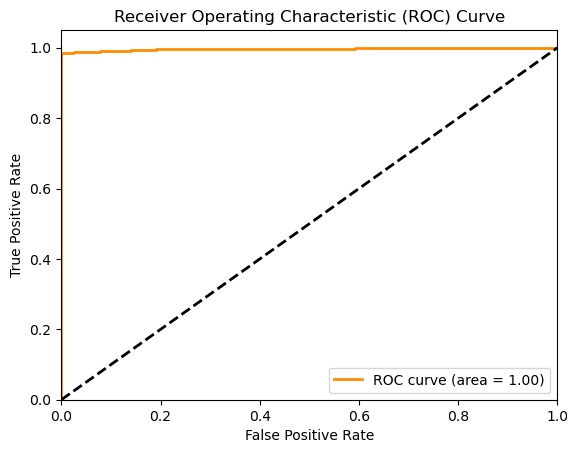

In [25]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc
import lightgbm as lgb
import matplotlib.pyplot as plt

def preprocess_data(df):
    # Exclude datetime columns
    non_datetime_cols = df.select_dtypes(exclude=['datetime64']).columns
    X = df[non_datetime_cols]

    # Separate features and target variable
    X = X.drop('Tumor_Type', axis=1)  # Replace 'Tumor_Type' as the target column
    y = df['Tumor_Type']

    # Encode categorical variables
    X = pd.get_dummies(X, drop_first=True)

    # Encode target variable if it's categorical
    if y.dtype == 'object':
        le = LabelEncoder()
        y = le.fit_transform(y)  # Encode 'Malignant' as 1 and 'Benign' as 0

    # Standardize numerical features
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    return X, y

# Load dataset
# df = pd.read_excel('your_dataset.xlsx')

# Preprocess data
X, y = preprocess_data(df)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train LightGBM model
lgb_model = lgb.LGBMClassifier(random_state=42)
lgb_model.fit(X_train, y_train)

# Evaluate model
y_pred = lgb_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
roc_auc = roc_auc_score(y_test, lgb_model.predict_proba(X_test)[:, 1])

# Print metrics
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'ROC AUC: {roc_auc}')

# Plot ROC curve
fpr, tpr, _ = roc_curve(y_test, lgb_model.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {0:0.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()


# Catboost


Accuracy: 0.9971533143554291
Precision: 0.9971695811305409
Recall: 0.9971533143554291
F1 Score: 0.9971533670855618
ROC AUC: 0.9995752670458831


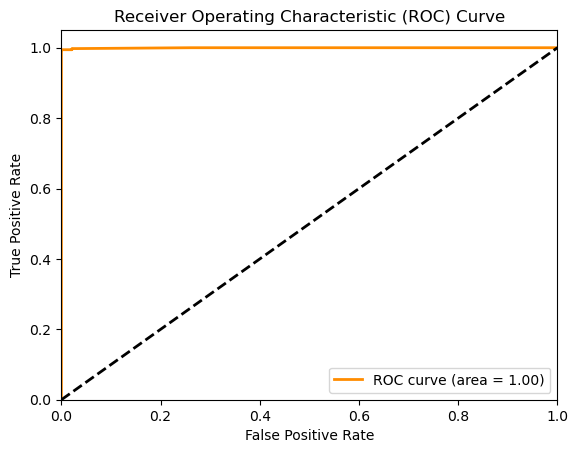

In [26]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc
from catboost import CatBoostClassifier
import matplotlib.pyplot as plt

def preprocess_data(df):
    # Exclude datetime columns
    non_datetime_cols = df.select_dtypes(exclude=['datetime64']).columns
    X = df[non_datetime_cols]

    # Separate features and target variable
    X = X.drop('Tumor_Type', axis=1)  # Replace 'Tumor_Type' as the target column
    y = df['Tumor_Type']

    # Encode categorical variables
    X = pd.get_dummies(X, drop_first=True)

    # Encode target variable if it's categorical
    if y.dtype == 'object':
        le = LabelEncoder()
        y = le.fit_transform(y)  # Encode 'Malignant' as 1 and 'Benign' as 0

    # Standardize numerical features
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    return X, y

# Load dataset
# df = pd.read_excel('your_dataset.xlsx')

# Preprocess data
X, y = preprocess_data(df)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train CatBoost model
catboost_model = CatBoostClassifier(random_state=42, verbose=0)
catboost_model.fit(X_train, y_train)

# Evaluate model
y_pred = catboost_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')
roc_auc = roc_auc_score(y_test, catboost_model.predict_proba(X_test)[:, 1])

# Print metrics
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'ROC AUC: {roc_auc}')

# Plot ROC curve
fpr, tpr, _ = roc_curve(y_test, catboost_model.predict_proba(X_test)[:, 1])
roc_auc = auc(fpr, tpr)

plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label='ROC curve (area = {0:0.2f})'.format(roc_auc))
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# LSTM

C:\Users\Daveee\anaconda3\Lib\site-packages\keras\src\layers\rnn\rnn.py:204: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
308/308 ━━━━━━━━━━━━━━━━━━━━ 83s 127ms/step - accuracy: 0.6456 - loss: 0.6548 - val_accuracy: 0.6958 - val_loss: 0.5330
Epoch 2/20
308/308 ━━━━━━━━━━━━━━━━━━━━ 34s 112ms/step - accuracy: 0.9427 - loss: 0.1896 - val_accuracy: 0.6836 - val_loss: 0.5486
Epoch 3/20
308/308 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - accuracy: 0.9594 - loss: 0.1195 - val_accuracy: 0.6763 - val_loss: 0.5442
Epoch 4/20
308/308 ━━━━━━━━━━━━━━━━━━━━ 36s 117ms/step - accuracy: 0.9809 - loss: 0.0708 - val_accuracy: 0.6795 - val_loss: 0.5410
Epoch 5/20
308/308 ━━━━━━━━━━━━━━━━━━━━ 36s 116ms/step - accuracy: 0.9920 - loss: 0.0508 - val_accuracy: 0.6804 - val_loss: 0.5402
Epoch 6/20
308/308 ━━━━━━━━━━━━━━━━━━━━ 37s 119ms/step - accuracy: 0.9959 - loss: 0.0401 - val_accuracy: 0.6755 - val_loss: 0.5394
Epoch 7/20
308/308 ━━━━━━━━━━━━━━━━━━━━ 41s 133ms/step - accuracy: 0.9979 - loss: 0.0303 - val_accuracy: 0.6755 - val_loss: 0.5390
Epoch 8/20
308/308 ━━━━━━━━━━━━━━━━━━━━ 40s 129ms/step - accuracy: 0.9971 - loss: 0

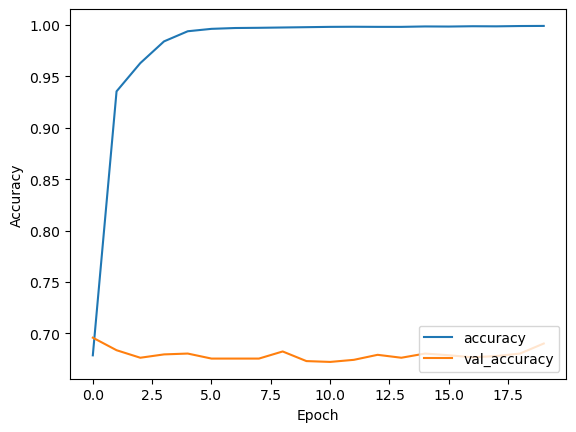

In [24]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
from sklearn.metrics import roc_curve, auc
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
import matplotlib.pyplot as plt

# Load dataset
# df = pd.read_excel('your_dataset.xlsx')

def preprocess_data(df):
    # Exclude datetime columns
    non_datetime_cols = df.select_dtypes(exclude=['datetime64']).columns
    X = df[non_datetime_cols]

    # Separate features and target variable
    X = X.drop('Tumor_Type', axis=1)  # Replace 'Tumor_Type' as the target column
    y = df['Tumor_Type']

    # Encode categorical variables
    X = pd.get_dummies(X, drop_first=True)

    # Encode target variable if it's categorical
    if y.dtype == 'object':
        le = LabelEncoder()
        y = le.fit_transform(y)  # Encode 'Malignant' as 1 and 'Benign' as 0

    # Standardize numerical features
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    return X, y

# Assuming df is already loaded
X, y = preprocess_data(df)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Reshape input data for LSTM
X_train = X_train.reshape(X_train.shape[0], 1, X_train.shape[1])
X_test = X_test.reshape(X_test.shape[0], 1, X_test.shape[1])

# Define LSTM model
model = Sequential([
    LSTM(units=50, input_shape=(X_train.shape[1], X_train.shape[2])),
    Dense(units=1, activation='sigmoid')  # Binary classification, use sigmoid activation for binary output
])

# Compile model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

# Train model
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

# Evaluate model
y_pred = (model.predict(X_test) > 0.5).astype("int32").flatten()
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Print metrics
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')

# Plot training history
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.show()

# Multi-Layer Perceptron (MLP) neural network (MLPNN)

C:\Users\Daveee\anaconda3\Lib\site-packages\keras\src\layers\core\dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/20
308/308 ━━━━━━━━━━━━━━━━━━━━ 71s 87ms/step - accuracy: 0.7893 - loss: 0.4199 - val_accuracy: 0.9496 - val_loss: 0.1557
Epoch 2/20
308/308 ━━━━━━━━━━━━━━━━━━━━ 22s 70ms/step - accuracy: 0.9984 - loss: 0.0090 - val_accuracy: 0.8613 - val_loss: 0.4211
Epoch 3/20
308/308 ━━━━━━━━━━━━━━━━━━━━ 22s 72ms/step - accuracy: 1.0000 - loss: 4.1531e-05 - val_accuracy: 0.8638 - val_loss: 0.4148
Epoch 4/20
308/308 ━━━━━━━━━━━━━━━━━━━━ 41s 71ms/step - accuracy: 1.0000 - loss: 1.8625e-06 - val_accuracy: 0.8642 - val_loss: 0.4136
Epoch 5/20
308/308 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 1.0000 - loss: 1.4109e-06 - val_accuracy: 0.8642 - val_loss: 0.4128
Epoch 6/20
308/308 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 1.0000 - loss: 1.6072e-06 - val_accuracy: 0.8646 - val_loss: 0.4121
Epoch 7/20
308/308 ━━━━━━━━━━━━━━━━━━━━ 23s 73ms/step - accuracy: 1.0000 - loss: 1.2454e-06 - val_accuracy: 0.8646 - val_loss: 0.4114
Epoch 8/20
308/308 ━━━━━━━━━━━━━━━━━━━━ 23s 74ms/step - accuracy: 1.00

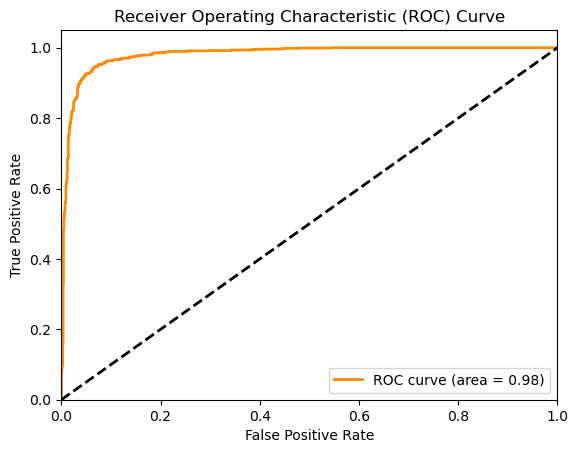

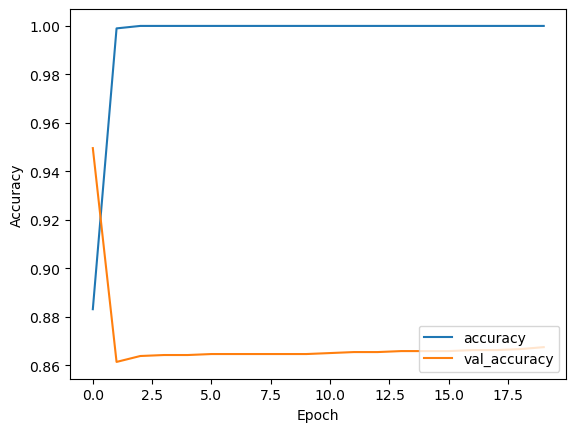

In [26]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score
from sklearn.metrics import roc_curve, auc
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
import matplotlib.pyplot as plt

# Load dataset
# df = pd.read_excel('your_dataset.xlsx')

def preprocess_data(df):
    # Exclude datetime columns
    non_datetime_cols = df.select_dtypes(exclude=['datetime64']).columns
    X = df[non_datetime_cols]

    # Separate features and target variable
    X = X.drop('Tumor_Type', axis=1)  # Replace 'Tumor_Type' as the target column
    y = df['Tumor_Type']

    # Encode categorical variables
    X = pd.get_dummies(X, drop_first=True)

    # Encode target variable if it's categorical
    if y.dtype == 'object':
        le = LabelEncoder()
        y = le.fit_transform(y)  # Encodes classes such as 'Malignant' and 'Benign'

    # Standardize numerical features
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    return X, y

# Assuming df is already loaded
X, y = preprocess_data(df)

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define MLP model (adjusted for binary classification)
model = Sequential([
    Dense(128, activation='relu', input_shape=(X_train.shape[1],)),
    Dense(64, activation='relu'),
    Dense(2, activation='softmax')  # Adjust to 2 units for binary classification
])

# Compile model (binary classification)
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train model
history = model.fit(X_train, y_train, epochs=20, batch_size=32, validation_data=(X_test, y_test))

# Evaluate model
y_probs = model.predict(X_test)
y_pred = np.argmax(y_probs, axis=-1)
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# ROC AUC for binary classification
roc_auc = roc_auc_score(y_test, y_probs[:, 1])

# Print metrics
print(f'Accuracy: {accuracy}')
print(f'Precision: {precision}')
print(f'Recall: {recall}')
print(f'F1 Score: {f1}')
print(f'ROC AUC: {roc_auc}')

# Plot ROC curve
fpr, tpr, _ = roc_curve(y_test, y_probs[:, 1])
plt.figure()
plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:0.2f})')
plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc="lower right")
plt.show()

# Plot training history
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label='val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')
plt.show()


## Model Expalnantion using Exaplanable AI such as:
- Train a CatBoost binary classifier wich best performed model 
- SHAP (SHapley Additive exPlanations) and
- LIME (Local Interpretable Model-agnostic Explanations)
## take Row  [1]

Initial DataFrame columns and types:
Age                    float64
Sex                      int32
Occupation               int32
Region                   int32
Zone                     int32
City                     int32
SubCity                  int32
Woreda                   int32
Kebel                    int32
Diagnosis                int32
Group diagonsis          int32
Type diagnosis           int32
Status                   int32
Unit                     int32
Pacient Weight           int32
BMI                      int32
Laboratory Service       int32
Price                  float64
Is Paid                float64
Is Available           float64
HistoryType              int32
History value            int32
Prescrption Type         int32
Prescribed Item          int32
Residence                int32
Tumor_Type               int32
Stage                    int32
Education_Level          int32
dtype: object
Dropped date columns: []
Columns with non-numeric values: []


 98%|===================| 2403/2459 [00:17<00:00]        

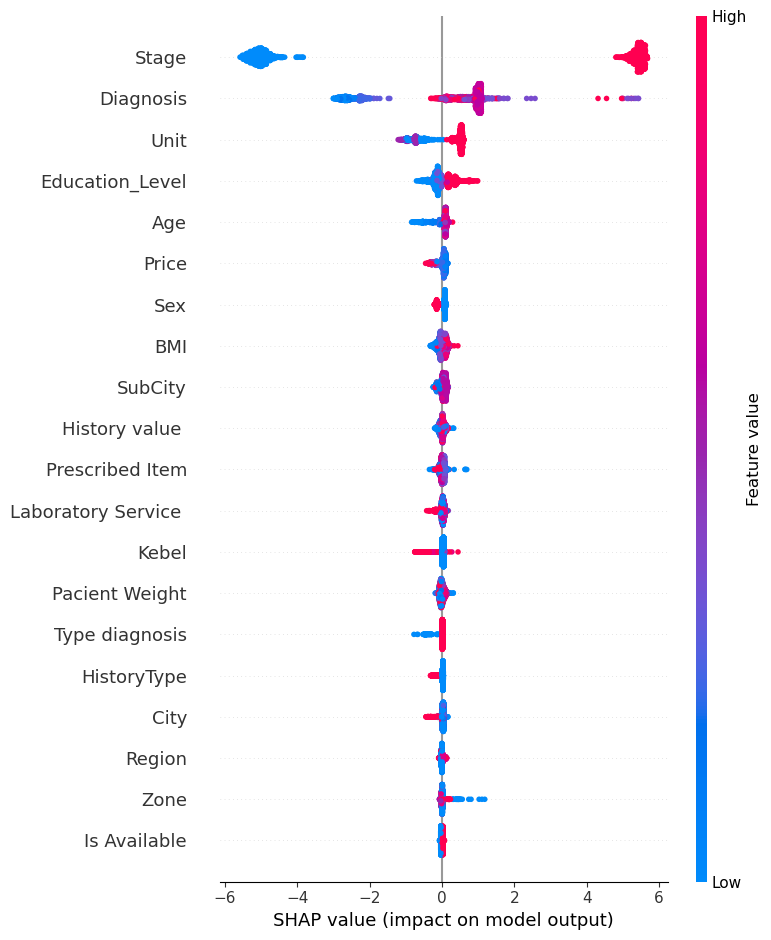

In [34]:
import pandas as pd
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier
import shap
from lime.lime_tabular import LimeTabularExplainer
from sklearn.preprocessing import LabelEncoder

# Load your dataset
# df = pd.read_csv('your_dataset.csv')  # Uncomment and modify to load your data

# Assuming df is your DataFrame containing the data
# Example: df = pd.DataFrame(...)

# # Print initial DataFrame columns and types for debugging
print("Initial DataFrame columns and types:")
print(df.dtypes)

# Identify and drop date and time columns
date_columns = df.select_dtypes(include=['datetime64[ns]', 'datetime64[ns, UTC]']).columns.tolist()
df = df.drop(columns=date_columns, errors='ignore')  # Drop date columns
print(f"Dropped date columns: {date_columns}")

# List columns with non-numeric values (categorical)
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

# Print columns with non-numeric values
print(f"Columns with non-numeric values: {categorical_columns}")

# Encode categorical columns using LabelEncoder for SHAP (CatBoost handles this internally, but SHAP needs numeric data)
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

# Split data into features and target variable
X = df.drop(columns=['Tumor_Type'])  # Target variable is 'Tumor_Type'
y = df['Tumor_Type']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Remove 'Tumor_Type' from categorical columns (since it's the target)
categorical_columns = [col for col in categorical_columns if col != 'Tumor_Type']

# Train a CatBoost model with handling of categorical features
model = CatBoostClassifier(iterations=100, learning_rate=0.1, depth=6, verbose=False)
model.fit(X_train, y_train, cat_features=categorical_columns)

# --------------------------------
# EXPLAINING WITH SHAP
# --------------------------------

# Initialize SHAP explainer with the trained CatBoost model
explainer = shap.Explainer(model, X_train)

# Calculate SHAP values for test data
shap_values = explainer(X_test)

# Visualize SHAP values using the original feature names
shap.summary_plot(shap_values, X_test)

# --------------------------------
# EXPLAINING WITH LIME
# --------------------------------

# Initialize LIME explainer using the original feature names
lime_explainer = LimeTabularExplainer(X_train.values,
                                      feature_names=X_train.columns,
                                      class_names=['Benign', 'Malignant'],
                                      categorical_features=[X_train.columns.get_loc(col) for col in categorical_columns],
                                      mode='classification')

# Explain individual predictions using LIME
instance_to_explain = X_test.iloc[1]
explanation = lime_explainer.explain_instance(instance_to_explain.values, model.predict_proba)

# Visualize LIME explanation
explanation.show_in_notebook()

## take Row  [6]

Initial DataFrame columns and types:
Age                    float64
Sex                      int32
Occupation               int32
Region                   int32
Zone                     int32
City                     int32
SubCity                  int32
Woreda                   int32
Kebel                    int32
Diagnosis                int32
Group diagonsis          int32
Type diagnosis           int32
Status                   int32
Unit                     int32
Pacient Weight           int32
BMI                      int32
Laboratory Service       int32
Price                  float64
Is Paid                float64
Is Available           float64
HistoryType              int32
History value            int32
Prescrption Type         int32
Prescribed Item          int32
Residence                int32
Tumor_Type               int32
Stage                    int32
Education_Level          int32
dtype: object
Dropped date columns: []
Columns with non-numeric values: []


 96%|=================== | 2372/2459 [00:17<00:00]       

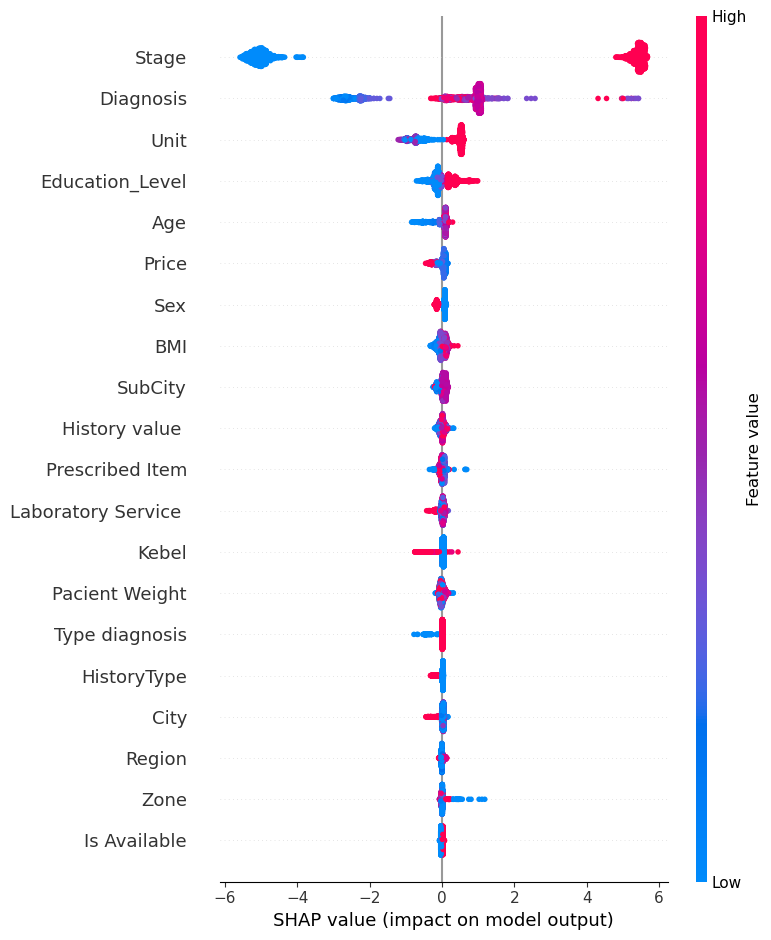

In [35]:
import pandas as pd
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier
import shap
from lime.lime_tabular import LimeTabularExplainer
from sklearn.preprocessing import LabelEncoder

# Load your dataset
# df = pd.read_csv('your_dataset.csv')  # Uncomment and modify to load your data

# Assuming df is your DataFrame containing the data
# Example: df = pd.DataFrame(...)

# # Print initial DataFrame columns and types for debugging
print("Initial DataFrame columns and types:")
print(df.dtypes)

# Identify and drop date and time columns
date_columns = df.select_dtypes(include=['datetime64[ns]', 'datetime64[ns, UTC]']).columns.tolist()
df = df.drop(columns=date_columns, errors='ignore')  # Drop date columns
print(f"Dropped date columns: {date_columns}")

# List columns with non-numeric values (categorical)
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

# Print columns with non-numeric values
print(f"Columns with non-numeric values: {categorical_columns}")

# Encode categorical columns using LabelEncoder for SHAP (CatBoost handles this internally, but SHAP needs numeric data)
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

# Split data into features and target variable
X = df.drop(columns=['Tumor_Type'])  # Target variable is 'Tumor_Type'
y = df['Tumor_Type']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Remove 'Tumor_Type' from categorical columns (since it's the target)
categorical_columns = [col for col in categorical_columns if col != 'Tumor_Type']

# Train a CatBoost model with handling of categorical features
model = CatBoostClassifier(iterations=100, learning_rate=0.1, depth=6, verbose=False)
model.fit(X_train, y_train, cat_features=categorical_columns)

# --------------------------------
# EXPLAINING WITH SHAP
# --------------------------------

# Initialize SHAP explainer with the trained CatBoost model
explainer = shap.Explainer(model, X_train)

# Calculate SHAP values for test data
shap_values = explainer(X_test)

# Visualize SHAP values using the original feature names
shap.summary_plot(shap_values, X_test)

# --------------------------------
# EXPLAINING WITH LIME
# --------------------------------

# Initialize LIME explainer using the original feature names
lime_explainer = LimeTabularExplainer(X_train.values,
                                      feature_names=X_train.columns,
                                      class_names=['Benign', 'Malignant'],
                                      categorical_features=[X_train.columns.get_loc(col) for col in categorical_columns],
                                      mode='classification')

# Explain individual predictions using LIME
instance_to_explain = X_test.iloc[6]
explanation = lime_explainer.explain_instance(instance_to_explain.values, model.predict_proba)

# Visualize LIME explanation
explanation.show_in_notebook()

## take Row  [200]

Initial DataFrame columns and types:
Age                    float64
Sex                      int32
Occupation               int32
Region                   int32
Zone                     int32
City                     int32
SubCity                  int32
Woreda                   int32
Kebel                    int32
Diagnosis                int32
Group diagonsis          int32
Type diagnosis           int32
Status                   int32
Unit                     int32
Pacient Weight           int32
BMI                      int32
Laboratory Service       int32
Price                  float64
Is Paid                float64
Is Available           float64
HistoryType              int32
History value            int32
Prescrption Type         int32
Prescribed Item          int32
Residence                int32
Tumor_Type               int32
Stage                    int32
Education_Level          int32
dtype: object
Dropped date columns: []
Columns with non-numeric values: []


 95%|=================== | 2338/2459 [00:17<00:00]       

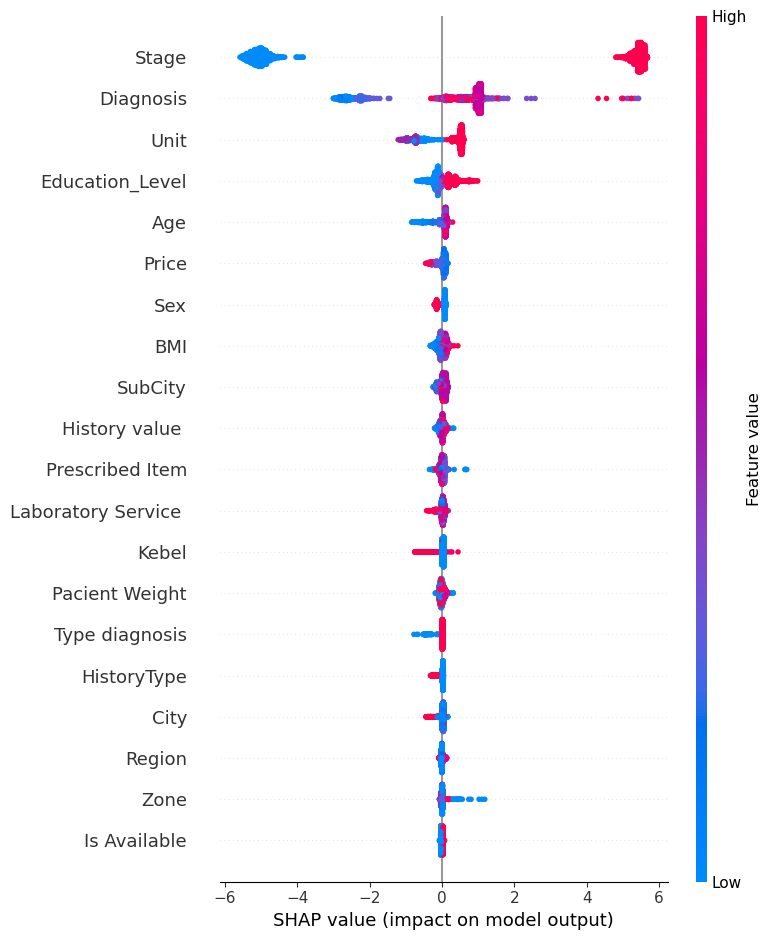

In [36]:
import pandas as pd
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier
import shap
from lime.lime_tabular import LimeTabularExplainer
from sklearn.preprocessing import LabelEncoder

# Load your dataset
# df = pd.read_csv('your_dataset.csv')  # Uncomment and modify to load your data

# Assuming df is your DataFrame containing the data
# Example: df = pd.DataFrame(...)

# # Print initial DataFrame columns and types for debugging
print("Initial DataFrame columns and types:")
print(df.dtypes)

# Identify and drop date and time columns
date_columns = df.select_dtypes(include=['datetime64[ns]', 'datetime64[ns, UTC]']).columns.tolist()
df = df.drop(columns=date_columns, errors='ignore')  # Drop date columns
print(f"Dropped date columns: {date_columns}")

# List columns with non-numeric values (categorical)
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

# Print columns with non-numeric values
print(f"Columns with non-numeric values: {categorical_columns}")

# Encode categorical columns using LabelEncoder for SHAP (CatBoost handles this internally, but SHAP needs numeric data)
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

# Split data into features and target variable
X = df.drop(columns=['Tumor_Type'])  # Target variable is 'Tumor_Type'
y = df['Tumor_Type']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Remove 'Tumor_Type' from categorical columns (since it's the target)
categorical_columns = [col for col in categorical_columns if col != 'Tumor_Type']

# Train a CatBoost model with handling of categorical features
model = CatBoostClassifier(iterations=100, learning_rate=0.1, depth=6, verbose=False)
model.fit(X_train, y_train, cat_features=categorical_columns)

# --------------------------------
# EXPLAINING WITH SHAP
# --------------------------------

# Initialize SHAP explainer with the trained CatBoost model
explainer = shap.Explainer(model, X_train)

# Calculate SHAP values for test data
shap_values = explainer(X_test)

# Visualize SHAP values using the original feature names
shap.summary_plot(shap_values, X_test)

# --------------------------------
# EXPLAINING WITH LIME
# --------------------------------

# Initialize LIME explainer using the original feature names
lime_explainer = LimeTabularExplainer(X_train.values,
                                      feature_names=X_train.columns,
                                      class_names=['Benign', 'Malignant'],
                                      categorical_features=[X_train.columns.get_loc(col) for col in categorical_columns],
                                      mode='classification')

# Explain individual predictions using LIME
instance_to_explain = X_test.iloc[200]
explanation = lime_explainer.explain_instance(instance_to_explain.values, model.predict_proba)

# Visualize LIME explanation
explanation.show_in_notebook()

## take Row  [0]

Initial DataFrame columns and types:
Age                    float64
Sex                      int32
Occupation               int32
Region                   int32
Zone                     int32
City                     int32
SubCity                  int32
Woreda                   int32
Kebel                    int32
Diagnosis                int32
Group diagonsis          int32
Type diagnosis           int32
Status                   int32
Unit                     int32
Pacient Weight           int32
BMI                      int32
Laboratory Service       int32
Price                  float64
Is Paid                float64
Is Available           float64
HistoryType              int32
History value            int32
Prescrption Type         int32
Prescribed Item          int32
Residence                int32
Tumor_Type               int32
Stage                    int32
Education_Level          int32
dtype: object
Dropped date columns: []
Columns with non-numeric values: []


 96%|=================== | 2358/2459 [00:17<00:00]       

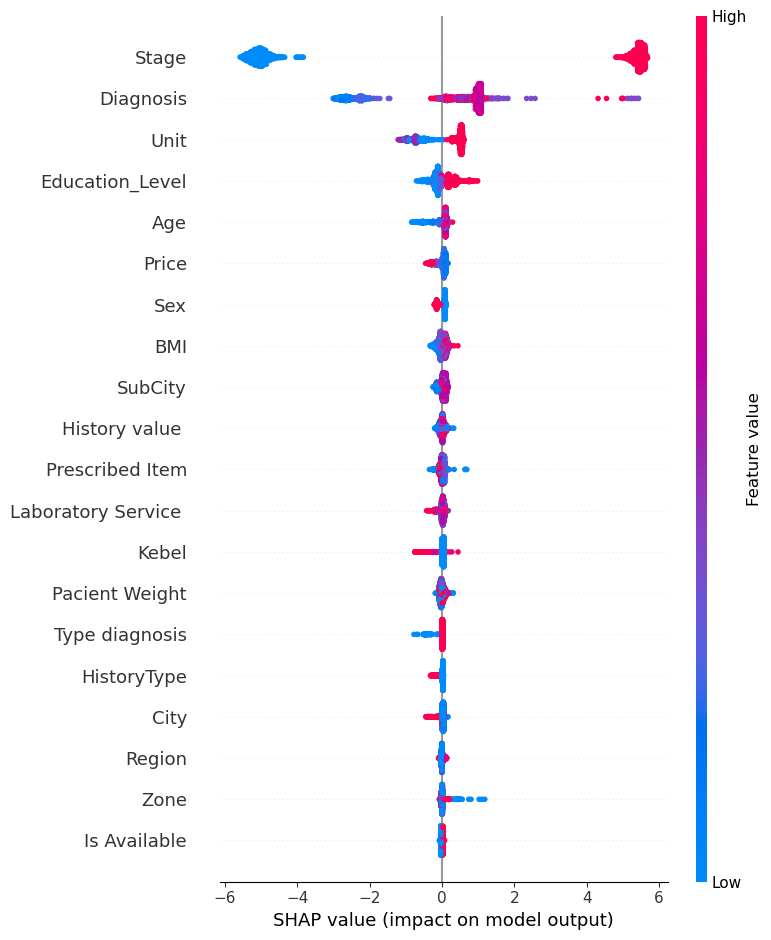

In [39]:
import pandas as pd
from sklearn.model_selection import train_test_split
from catboost import CatBoostClassifier
import shap
from lime.lime_tabular import LimeTabularExplainer
from sklearn.preprocessing import LabelEncoder

# Load your dataset
# df = pd.read_csv('your_dataset.csv')  # Uncomment and modify to load your data

# Assuming df is your DataFrame containing the data
# Example: df = pd.DataFrame(...)

# # Print initial DataFrame columns and types for debugging
print("Initial DataFrame columns and types:")
print(df.dtypes)

# Identify and drop date and time columns
date_columns = df.select_dtypes(include=['datetime64[ns]', 'datetime64[ns, UTC]']).columns.tolist()
df = df.drop(columns=date_columns, errors='ignore')  # Drop date columns
print(f"Dropped date columns: {date_columns}")

# List columns with non-numeric values (categorical)
categorical_columns = df.select_dtypes(include=['object']).columns.tolist()

# Print columns with non-numeric values
print(f"Columns with non-numeric values: {categorical_columns}")

# Encode categorical columns using LabelEncoder for SHAP (CatBoost handles this internally, but SHAP needs numeric data)
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le

# Split data into features and target variable
X = df.drop(columns=['Tumor_Type'])  # Target variable is 'Tumor_Type'
y = df['Tumor_Type']

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Remove 'Tumor_Type' from categorical columns (since it's the target)
categorical_columns = [col for col in categorical_columns if col != 'Tumor_Type']

# Train a CatBoost model with handling of categorical features
model = CatBoostClassifier(iterations=100, learning_rate=0.1, depth=6, verbose=False)
model.fit(X_train, y_train, cat_features=categorical_columns)

# --------------------------------
# EXPLAINING WITH SHAP
# --------------------------------

# Initialize SHAP explainer with the trained CatBoost model
explainer = shap.Explainer(model, X_train)

# Calculate SHAP values for test data
shap_values = explainer(X_test)

# Visualize SHAP values using the original feature names
shap.summary_plot(shap_values, X_test)

# --------------------------------
# EXPLAINING WITH LIME
# --------------------------------

# Initialize LIME explainer using the original feature names
lime_explainer = LimeTabularExplainer(X_train.values,
                                      feature_names=X_train.columns,
                                      class_names=['Benign', 'Malignant'],
                                      categorical_features=[X_train.columns.get_loc(col) for col in categorical_columns],
                                      mode='classification')

# Explain individual predictions using LIME
instance_to_explain = X_test.iloc[0]
explanation = lime_explainer.explain_instance(instance_to_explain.values, model.predict_proba)

# Visualize LIME explanation
explanation.show_in_notebook()

## Save Best Performed Model
- CatBoost

In [29]:
import pandas as pd
from sklearn.preprocessing import LabelEncoder
from catboost import CatBoostClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
import joblib

# Random seed
seed = 42

# Read original dataset
# df = pd.read_csv("C:/Users/Daveee/Desktop/Python apps/Iris_stremalit - Copy/data.csv")
df = df.sample(frac=1, random_state=seed)  # Shuffle dataframe

# Example of columns that need encoding
categorical_columns = ['Sex', 'Occupation', 'Region', 'Zone', 'City', 'SubCity', 
                       'Woreda', 'Kebel', 'Diagnosis', 'Group diagonsis', 
                       'Type diagnosis', 'Status', 'Unit', 
                       'Pacient Weight', 'BMI', 'Laboratory Service ', 
                       'HistoryType', 'History value ', 'Prescrption Type', 
                       'Prescribed Item', 'Residence', 'Stage', 'Education_Level']

# Exclude date columns if they exist
date_columns = ['Date']  # Specify the date columns you want to exclude
df.drop(columns=date_columns, inplace=True, errors='ignore')  # Drop date columns

# Encode categorical columns
label_encoders = {}
for col in categorical_columns:
    le = LabelEncoder()
    df[col] = le.fit_transform(df[col])
    label_encoders[col] = le  # Save the encoder for future use if needed

# Encode target variable
le_target = LabelEncoder()
df['Tumor_Type'] = le_target.fit_transform(df['Tumor_Type'])
label_encoders['Tumor_Type'] = le_target

# Selecting features and target data
X = df[['Age', 'Sex', 'Occupation', 'Region', 'Zone', 'City', 'SubCity',
         'Woreda', 'Kebel', 'Diagnosis', 'Group diagonsis', 'Type diagnosis',
         'Status', 'Unit', 'Pacient Weight', 'BMI',
         'Laboratory Service ', 'Price', 'Is Paid', 'Is Available',
         'HistoryType', 'History value ', 'Prescrption Type', 'Prescribed Item',
         'Residence', 'Stage', 'Education_Level']]
y = df['Tumor_Type']

# Split data into train and test sets (80% training and 20% test)
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=seed, stratify=y)

# Create an instance of the CatBoost classifier
clf = CatBoostClassifier(iterations=100, learning_rate=0.1, depth=6, 
                         cat_features=categorical_columns, verbose=False)

# Train the classifier on the training data
clf.fit(X_train, y_train)

# Predict on the test set
y_pred = clf.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

# Save the model and label encoders individually
joblib.dump(clf, "Tumor_type_CatBoost_model.sav")


Accuracy: 0.9979666531110207


['Tumor_type_CatBoost_model.sav']

## Save Label Encoder 
- We use Label encoder for Catagorical feature  

In [29]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
import pickle
from catboost import CatBoostClassifier

# Load your data
# df = pd.read_csv('your_training_data.csv')

# Dictionary to hold label encoders
label_encoders = {}

# Encode categorical columns
for column in df.select_dtypes(include=['object']).columns:
    label_encoder = LabelEncoder()
    df[column] = label_encoder.fit_transform(df[column])
    label_encoders[column] = label_encoder

# Save the label encoders to disk
with open('label_encoders.pkl', 'wb') as f:
    pickle.dump(label_encoders, f)

# Ensure all features are numeric and convert to numpy array
features = df.drop('Tumor_Type', axis=1).values.astype(np.float32)  # Update target variable
target = df['Tumor_Type'].values  # Update target variable

# Train your CatBoost model
tumor_type_model = CatBoostClassifier(iterations=100, learning_rate=0.1, depth=6, verbose=False)
tumor_type_model.fit(features, target)

# # Optional: Save the trained CatBoost model
# tumor_type_model.save_model('tumor_type_catboost_model.cbm')


# Save MinMax scaler

In [31]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import pickle

# Load data from Excel file into a DataFrame
# file_path = 'your_file.xlsx'
# df = pd.read_excel(file_path)

# Identify numeric features
numeric_features = df.select_dtypes(include=['number']).columns.tolist()

# Initialize MinMaxScaler and fit on numeric features
scalers = {}
for feature in numeric_features:
    scaler = MinMaxScaler()
    df[feature] = scaler.fit_transform(df[[feature]])
    scalers[feature] = scaler

# Save MinMax scalers to a pickle file
output_file = 'minmax_scalers.pkl'
with open(output_file, 'wb') as f:
    pickle.dump(scalers, f)

print(f"MinMax scalers saved to {output_file}")


MinMax scalers saved to minmax_scalers.pkl


In [57]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from catboost import CatBoostClassifier
import joblib

# Load your dataset
# df = pd.read_csv('your_dataset.csv')

# Exclude any columns related to dates (if any exist in the dataset)
date_columns = ['Date']  # Replace with actual date column names if applicable
df = df.drop(columns=date_columns, errors='ignore')

# Split features and target (assuming 'Tumor_Type' is the target column)
X = df.drop(columns=['Tumor_Type'])
y = df['Tumor_Type']

# Identify categorical features (assume 'object', 'category', and 'bool' types)
categorical_cols = X.select_dtypes(include=['object', 'category', 'bool']).columns

# Include 'Laboratory Service' explicitly if it needs to be treated as categorical
if 'Laboratory Service' in X.columns:
    categorical_cols = categorical_cols.tolist() + ['Laboratory Service']

# Apply Label Encoding for categorical features
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col])
    label_encoders[col] = le  # Save the encoder for each categorical feature

# Identify numerical features for scaling
numerical_cols = X.select_dtypes(include=['int64', 'float64']).columns

# Apply MinMax Scaling for numerical features
scaler = MinMaxScaler()
X[numerical_cols] = scaler.fit_transform(X[numerical_cols])

# Save the scaler min and max values for deployment
scaler_params = {
    'min': scaler.data_min_,
    'scale': scaler.scale_
}
joblib.dump(scaler_params, 'scaler_params.pkl')

# Split data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the CatBoost model
catboost_model = CatBoostClassifier(iterations=1000, learning_rate=0.1, depth=6, verbose=100)
catboost_model.fit(X_train, y_train)

# Save the CatBoost model
joblib.dump(catboost_model, 'catboost_model.pkl')

# Save the label encoders
joblib.dump(label_encoders, 'label_encoders.pkl')

# Example of how to load the model, label encoders, and scaler for deployment
# loaded_model = joblib.load('catboost_model.pkl')
# loaded_label_encoders = joblib.load('label_encoders.pkl')
# loaded_scaler_params = joblib.load('scaler_params.pkl')


0:	learn: 0.4762190	total: 10.3ms	remaining: 10.3s
100:	learn: 0.0080537	total: 871ms	remaining: 7.75s
200:	learn: 0.0042073	total: 1.66s	remaining: 6.58s
300:	learn: 0.0041172	total: 2.28s	remaining: 5.3s
400:	learn: 0.0041172	total: 3.03s	remaining: 4.53s
500:	learn: 0.0041172	total: 3.64s	remaining: 3.63s
600:	learn: 0.0041165	total: 4.24s	remaining: 2.81s
700:	learn: 0.0041165	total: 4.83s	remaining: 2.06s
800:	learn: 0.0041165	total: 5.43s	remaining: 1.35s
900:	learn: 0.0041164	total: 6.01s	remaining: 661ms
999:	learn: 0.0041164	total: 6.59s	remaining: 0us


['label_encoders.pkl']

In [56]:
df.columns

Index(['Age', 'Sex', 'Occupation', 'Region', 'Zone', 'City', 'SubCity',
       'Woreda', 'Kebel', 'Diagnosis', 'Group diagonsis', 'Type diagnosis',
       'Status', 'Unit', 'Pacient Weight', 'BMI', 'Laboratory Service ',
       'Price', 'Is Paid', 'Is Available', 'HistoryType', 'History value ',
       'Prescrption Type', 'Prescribed Item', 'Residence', 'Tumor_Type',
       'Stage', 'Education_Level'],
      dtype='object')

# ***Phase III***
## Model deployment on streamlit, Dash, Gradio Python frameworks
- we Save 
- model with Best preformed Algorithism such CatBoost
- Labelencoder for catgorical feature
- MinMax scaler for Numerical features 
-  ** Next Step load all them support GUI for potenical user 